# Assignment 1:  Superpixels and Image Segmentation.

Name: **Thrun V. Puthanveettil**

UID:  **119069516**

Link to Google Drive : **View-only Link to Notebook Here (make sure it works)**

Please submit a PDF containing all outputs to gradescope by **October 5, 11:59pm**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

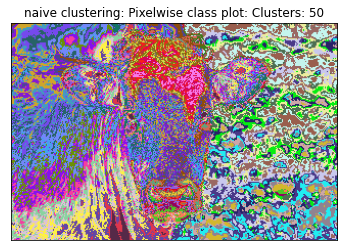

You will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

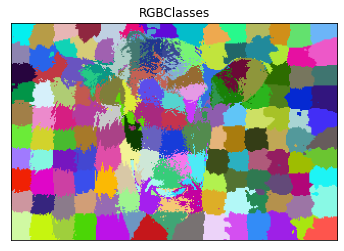

You will then build a segmentation network by training a deep neural network on your superpixels. This part is fairly open-ended, feel free to try any model you can think of (GNN, CNN, Transformer, etc.).

To give an example, for a CNN-based system that reformulates segmentation as superpixel image classification, there are basically three steps in the training stage:

1. Dilate and save each superpixel region from SLIC output into image of size 224X224, alongwith the ground truth segments label.
2. Build a couple of convolution layers to extract the deep features from each Superpixel patch image. Let the last layer be Fully connected layers.
3. Define the segmentation loss as multi-class classification loss and train a convolutional neural network based classifier.

Then, during inference, you would combine the classifier's predicted labels to form the whole input image's Superpixel segmentation results.

## Part 1: Superpixels

For this first part of the assignment, you will implement 2 superpixels methods: k-means pixel clustering, and SLIC.

### Data

First, we download the MSRC labeled imaged database.

In [1]:
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
!unzip --qq msrc_objcategimagedatabase_v1.zip

--2023-10-06 18:01:35--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.209.109.125, 2600:1417:76:796::317f, 2600:1417:76:792::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.209.109.125|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2023-10-06 18:01:35--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|23.209.109.125|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M  

For the first part of this assignment, we will only use the following images. We define the list below as `im_list`.

In [2]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [3]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im, title, xticks = [], yticks = [], isCv2 = True):
    """
    im :Image to plot
    title : Title of image
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm),
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value

    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot

    Output: None
    Creates a plot
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]

    plot_image(seg_img,title)

    return

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust}
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot:
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

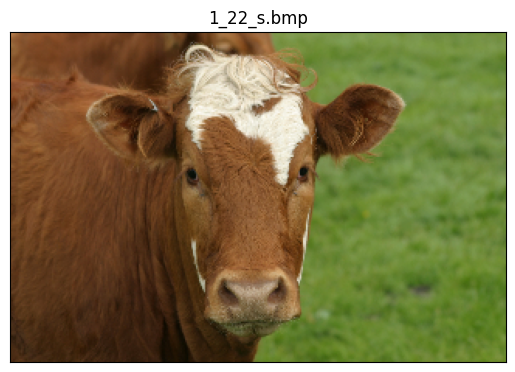

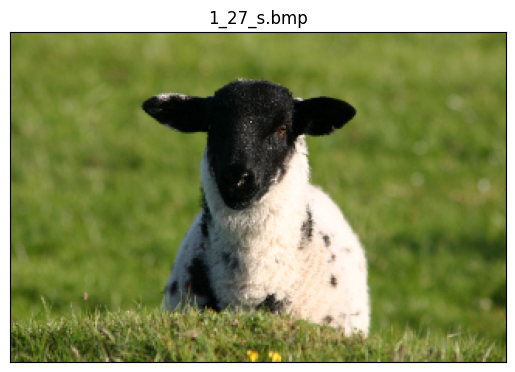

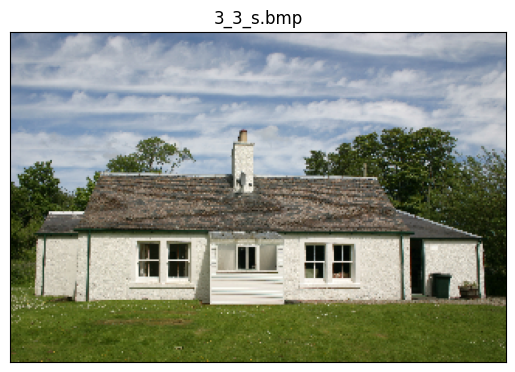

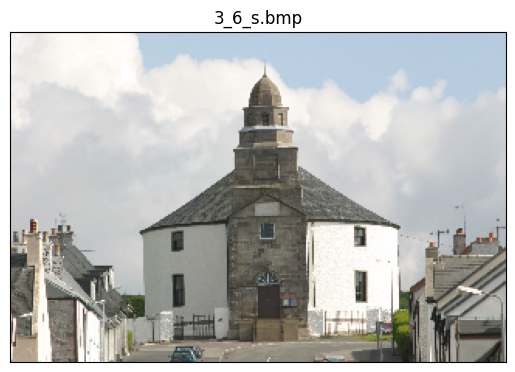

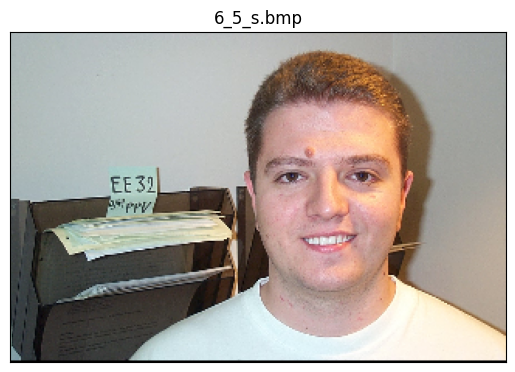

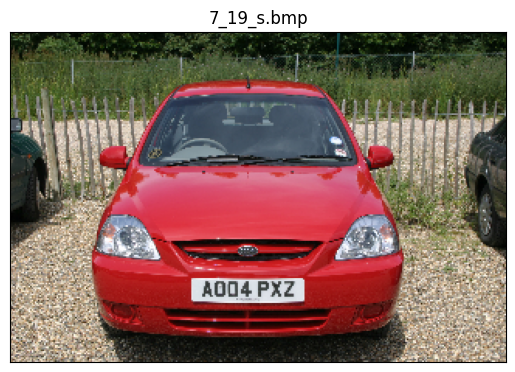

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

### Question 1: Perform k-means on image pixels `(r, g, b, x, y)`. (40 points)

The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b, x, y)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 25, 50, 150`.




/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` inste

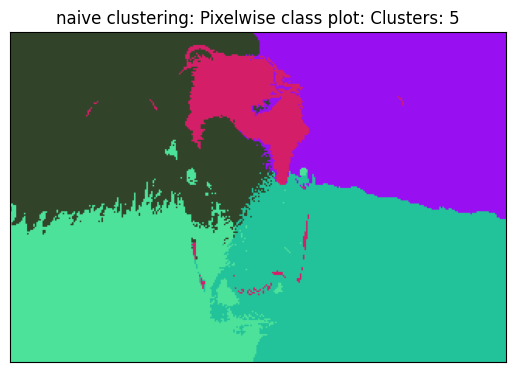

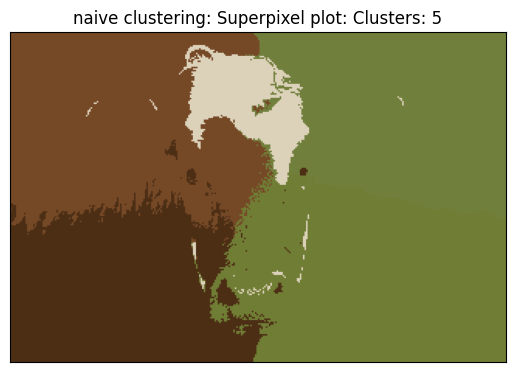

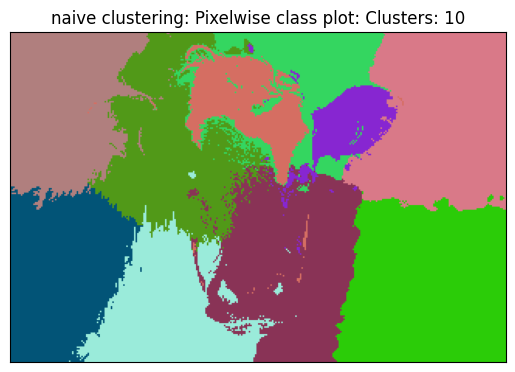

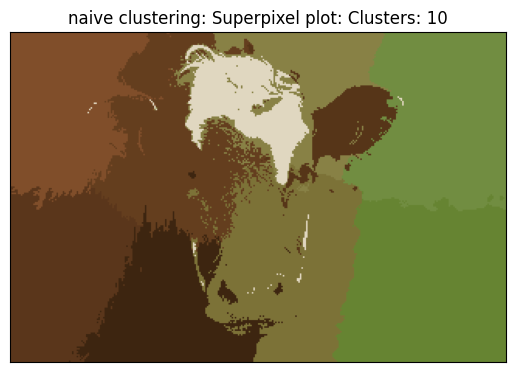

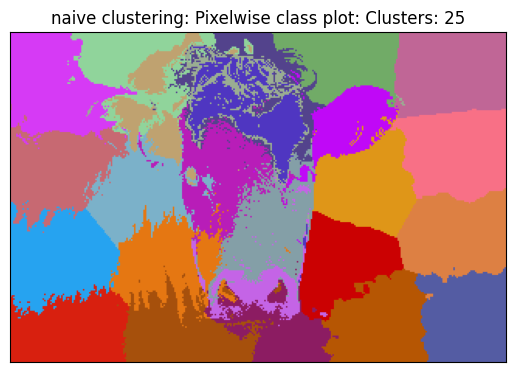

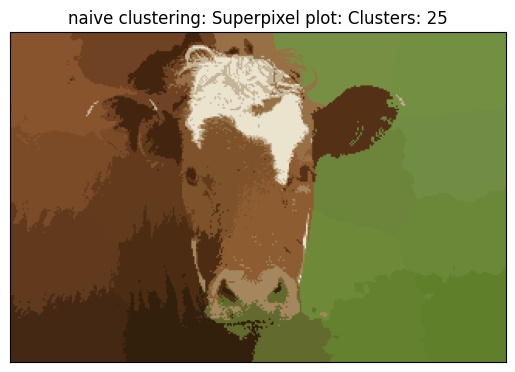

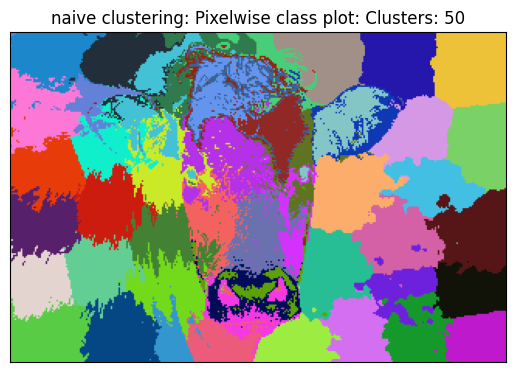

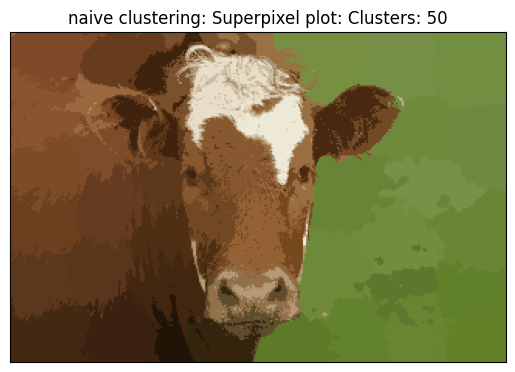

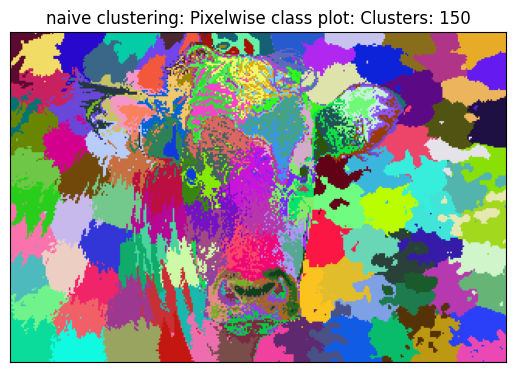

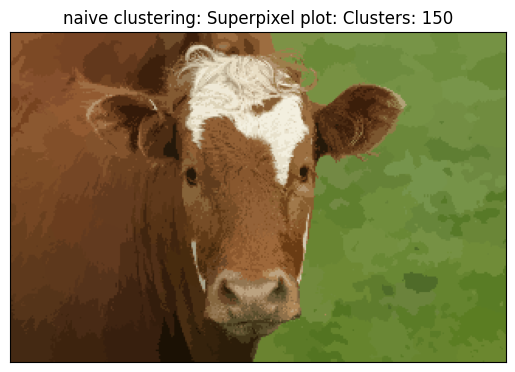

In [ ]:
from numpy.random import random
from sklearn.cluster import KMeans
import numpy as  np

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    # assert 1==2," NOT IMPLEMENTED"
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel
    # Loop through all pixel positions
    data_point = []
    height, width, _ = im.shape
    for y in range(height):
        for x in range(width):
            # Access pixel value at position (x, y)
            pixel_value = im[y, x]
            data_point.append([im[y, x, 0], im[y,x,1], im[y,x,2], y, x])
    X = np.array(data_point)
    kmeans = KMeans(n_clusters = k, init = "k-means++", random_state = 42 )
    y_means = kmeans.fit_predict(X)
    segmap = y_means.reshape([height, width])

    return segmap

im = cv2.imread(im_list[0])
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

Pick your favorite superpixel **k** value and plot results for all 6 images in `im_list`.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-5-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-5-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` inste

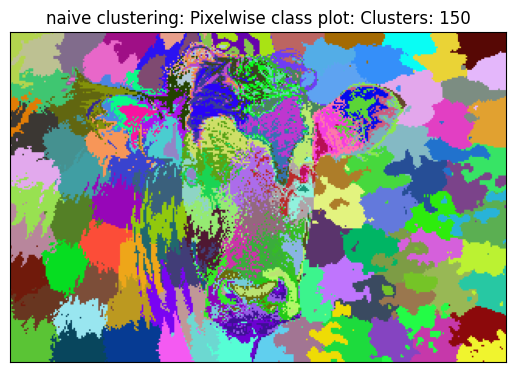

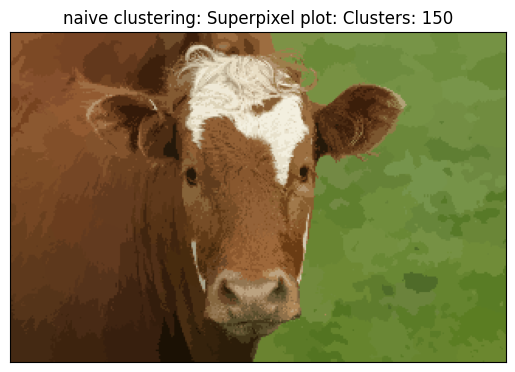

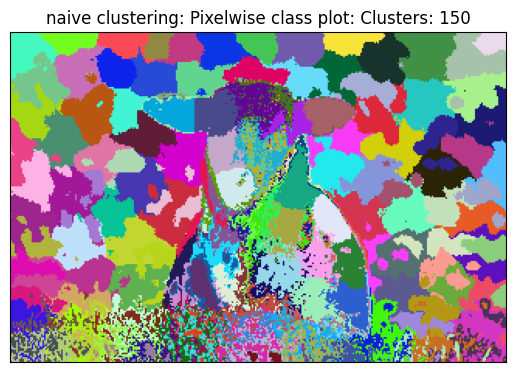

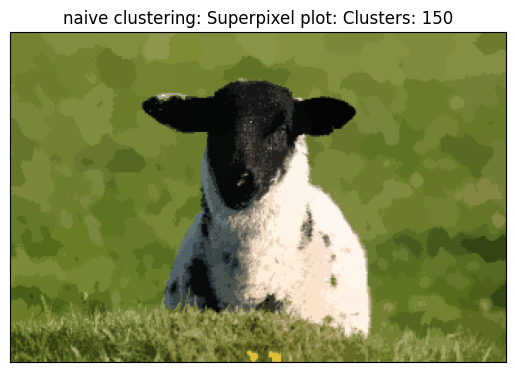

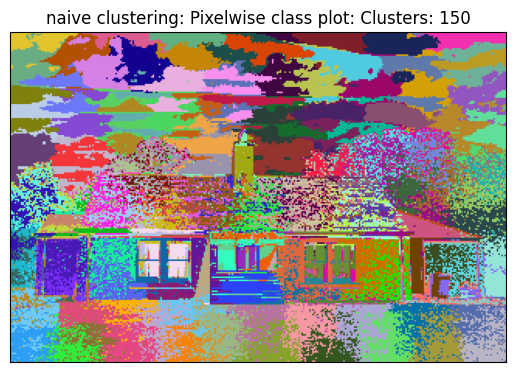

...

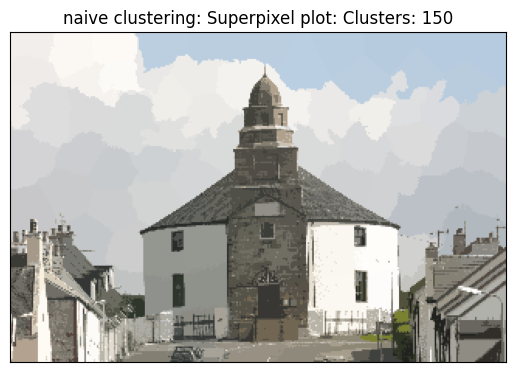

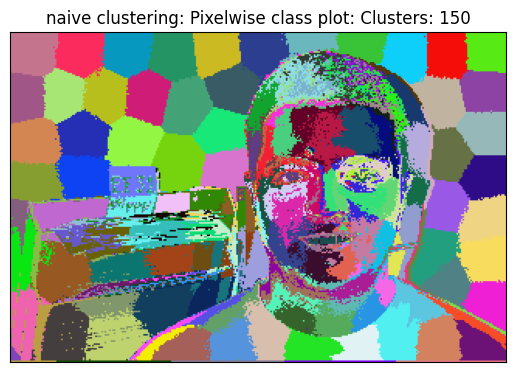

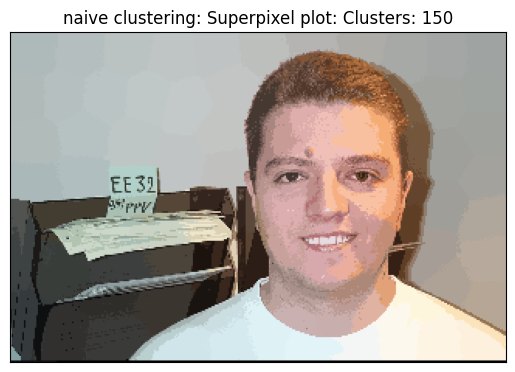

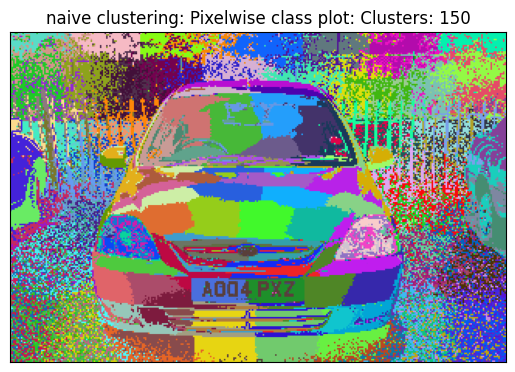

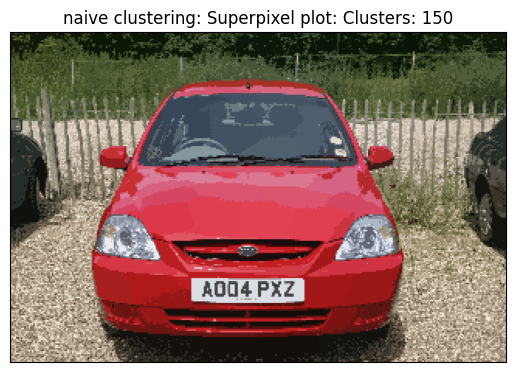

In [ ]:
# TODO: plot for 6 images with chosen k value
# im = cv2.imread(im_list[0])
n_images = 6
for i in im_list[:n_images]:
    im = cv2.imread(i)
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

### Question 2: Replicate SLIC and Show Results for 6 Images (50 points)

It doesn't look like we have a very favourable outcome with superpixels being implemented with simple clustering. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [4]:
############Algorithm############
#Compute grid steps: S
#you can explore different values of m
#initialize cluster centers [l,a,b,x,y] using
#Perturb for minimum G
#while not converged
##for every pixel:
####  compare distance D_s with each cluster center within 2S X 2S.
####  Assign to nearest cluster
##calculate new cluster center

import cv2
import numpy as np
from scipy.signal import convolve2d
from tqdm import tqdm
from scipy.stats import mode

# Function to convert RGB to LAB
def convert_rgb_to_lab(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

def slic_algorithm(image, m, num_iterations, num_superpixels, window_size):
    # Gradient Image
    # Compute the gradient image
    gradient = np.sqrt(convolve2d(image[:, :, 0], np.array([[1, -1], [1, -1]]), mode='same')**2 +
                        convolve2d(image[:, :, 1], np.array([[1, -1], [1, -1]]), mode='same')**2 +
                        convolve2d(image[:, :, 2], np.array([[1, -1], [1, -1]]), mode='same')**2)

    # Initializing the inter-cluster distance
    superpixel_size = int(np.sqrt(image.shape[0] * image.shape[1] / num_superpixels))

    # Create the grid
    cx = np.arange(superpixel_size, image.shape[0] - superpixel_size, superpixel_size)
    cy = np.arange(superpixel_size, image.shape[1] - superpixel_size, superpixel_size)
    # Create the cluster centers (grid) in the LAB color space with each cluster center stored as [l, a, b, x, y]
    superpixel_locations = np.array(np.meshgrid(cx, cy)).T.reshape(-1, 2)
    # Create the placeholder for storing l, a, b, x, y for each cluster center
    # Dimensions: [num_superpixels, 5] (i.e) for each cluster center, we store l, a, b, x, y
    superpixel_centers = np.zeros((len(superpixel_locations), 5))

    # For each cluster center, store l, a, b, x, y
    for i in range(len(superpixel_locations)):
        superpixel_centers[i, :] = [image[superpixel_locations[i, 0], superpixel_locations[i, 1], 0],
                                     image[superpixel_locations[i, 0], superpixel_locations[i, 1], 1],
                                     image[superpixel_locations[i, 0], superpixel_locations[i, 1], 2],
                                     superpixel_locations[i, 0], superpixel_locations[i, 1]]

    # Begining of SLIC Algorithm

    # STEP 1: Find the lowest gradient position in the neighborhood and move the cluster center to the lowest gradient position
    ##################################################################################################
    # Move the cluster center to the lowest gradient position in the neighborhood
    # Initialize the window size for creating the neighborhood around each cluster center
    half_window_size = int(np.floor(window_size / 2))
    # Compute the indices anchor for the neighborhood
    window_change = np.arange(-half_window_size, half_window_size + 1)

    # For each cluster center, move the cluster center to the lowest gradient position in the neighborhood
    for i in tqdm(range(len(superpixel_locations)), desc="SLIC Algorithm"):
        # Create the neighborhood with the size 2 * win x 2 * win around the cluster center with the cluster center in the center of the neighborhood
        window = gradient[superpixel_locations[i, 0] - half_window_size:superpixel_locations[i, 0] + half_window_size,
                          superpixel_locations[i, 1] - half_window_size:superpixel_locations[i, 1] + half_window_size]
        # Find the lowest gradient position in the neighborhood
        a1, b1 = np.unravel_index(np.argmin(window), window.shape)
        # Move the cluster center to the lowest gradient position
        # Note: superpixel_locations[i, 0] is the x-coordinate of the cluster center
        #       superpixel_locations[i, 1] is the y-coordinate of the cluster center
        superpixel_locations[i, 0] = superpixel_locations[i, 0] + window_change[b1]
        superpixel_locations[i, 1] = superpixel_locations[i, 1] + window_change[a1]
        # Update the cluster center
        # Note: superpixel_centers[i, 0] is the l-coordinate of the cluster center
        #       superpixel_centers[i, 1] is the a-coordinate of the cluster center
        #       superpixel_centers[i, 2] is the b-coordinate of the cluster center
        #       superpixel_centers[i, 3] is the x-coordinate of the cluster center
        #       superpixel_centers[i, 4] is the y-coordinate of the cluster center
        superpixel_centers[i, :] = [image[superpixel_locations[i, 0], superpixel_locations[i, 1], 0],
                                    image[superpixel_locations[i, 0], superpixel_locations[i, 1], 1],
                                    image[superpixel_locations[i, 0], superpixel_locations[i, 1], 2],
                                    superpixel_locations[i, 0], superpixel_locations[i, 1]]
    ##################################################################################################

    # STEP 2: Assign each pixel to the nearest cluster center
    ##################################################################################################
    # Iteratively assign each pixel to the nearest cluster center within 2 * superpixel_size x 2 * superpixel_size neighborhood based on the color distance and the spatial distance
    iteration = 0
    while iteration < num_iterations:
        # Create the placeholder for storing the cluster center assignments for each pixel
        superpixel_assignments = np.zeros_like(gradient)
        # For each pixel, assign the pixel to the nearest cluster center within 2 * superpixel_size x 2 * superpixel_size neighborhood based on the color distance and the spatial distance
        # Iterate through each pixel
        # Note: image.shape[0] is the number of rows in the image
        for i2 in range(image.shape[0]):
            # Note: image.shape[1] is the number of columns in the image
            for j2 in range(image.shape[1]):
                # Compute the distance between the pixel and each cluster center within 2 * superpixel_size x 2 * superpixel_size neighborhood
                distances = []
                # Iterate through each cluster center
                # Note: len(superpixel_locations) is the number of cluster centers
                for k2 in range(len(superpixel_locations)):
                    # Check if the cluster center is within 2 * superpixel_size x 2 * superpixel_size neighborhood of the pixel
                    # Note: superpixel_locations[k2, 0] is the x-coordinate of the cluster center
                    #       superpixel_locations[k2, 1] is the y-coordinate of the cluster center
                    if np.sqrt((i2 - superpixel_centers[k2, 3])**2 + (j2 - superpixel_centers[k2, 4])**2) <= 2 * superpixel_size:
                        # Compute the distance between the pixel and the cluster center
                        # Note: image[i2, j2, 0] and image[i2, j2, 1] and image[i2, j2, 2] are the l, a, b coordinates of the pixel
                        #       image[i2, j2, 3] and image[i2, j2, 4] are the x, y coordinates of the pixel
                        #       superpixel_centers[k2, 0] and superpixel_centers[k2, 1] and superpixel_centers[k2, 2] are the l, a, b coordinates of the cluster center
                        #       superpixel_centers[k2, 3] and superpixel_centers[k2, 4] are the x, y coordinates of the cluster center
                        dist = np.sqrt((image[i2, j2, 0] - superpixel_centers[k2, 0])**2 +
                                       (image[i2, j2, 1] - superpixel_centers[k2, 1])**2 +
                                       (image[i2, j2, 2] - superpixel_centers[k2, 2])**2) + \
                               m / superpixel_size * np.sqrt((i2 - superpixel_centers[k2, 3])**2 +
                                                             (j2 - superpixel_centers[k2, 4])**2)
                        # Store the distance and the cluster center index
                        distances.append([dist, k2])
                # Assign the the index of the cluster center with the minimum distance to the pixel
                if distances:
                    # Find the cluster center with the minimum distance to the pixel
                    min_dist, new_cluster_center_index = min(distances, key=lambda x: x[0])
                    superpixel_assignments[i2, j2] = new_cluster_center_index

        # STEP 3: Update the cluster centers
        ##################################################################################################
        # Update the cluster centers
        for i3 in range(len(superpixel_locations)):
            # Find the pixels assigned to the cluster center i3 and compute the average spatial position of the pixels assigned to the cluster center
            row, col = np.where(superpixel_assignments == i3)
            # Compute the average spatial position of the pixels assigned to the cluster center
            if row.size > 0 and col.size > 0:
                # Note: np.mean(row) is the average of the row indices of the pixels assigned to the cluster center
                #       np.mean(col) is the average of the column indices of the pixels assigned to the cluster center
                row_mean = int(np.round(np.mean(row)))
                col_mean = int(np.round(np.mean(col)))
                # Update the cluster center
                # Note: superpixel_centers[i3, 0] is the l-coordinate of the cluster center
                #       superpixel_centers[i3, 1] is the a-coordinate of the cluster center
                #       superpixel_centers[i3, 2] is the b-coordinate of the cluster center
                #       superpixel_centers[i3, 3] is the x-coordinate of the cluster center
                #       superpixel_centers[i3, 4] is the y-coordinate of the cluster center
                superpixel_centers[i3, :] = [image[row_mean, col_mean, 0], image[row_mean, col_mean, 1],
                                             image[row_mean, col_mean, 2], row_mean, col_mean]
        ##################################################################################################

        # Update the iteration
        iteration += 1
    ##################################################################################################

    # STEP 4: Create the superpixel mask
    ##################################################################################################
    # Create the placeholder for superpixel mask with the size of the image
    superpixel_mask = np.zeros_like(gradient)
    # For each pixel, assign the pixel with the label of the cluster center
    # Iterate through each pixel
    # Note: image.shape[0] is the number of rows in the image
    for i4 in range(image.shape[0]):
        # Note: image.shape[1] is the number of columns in the image
        for j4 in range(image.shape[1]):
            # Assign the pixel with the label of the cluster center
            # Note: superpixel_assignments[i4, j4] is the label of the cluster center
            superpixel_mask[i4, j4] = superpixel_assignments[i4, j4]

    return superpixel_mask




def SLIC(im, k):
    """
    Input arguments:
    im: image input
    k: number of cluster segments


    Compute
    S: As described in the paper
    m: As described in the paper (use the same value as in the paper)
    follow the algorithm..

    returns:
    segmap: 2D matrix where each value corresponds to the image pixel's cluster number
    """


    # Resize the image for faster processing
    # image = cv2.resize(image, (0, 0), fx=0.4, fy=0.4)
    image = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

    # Convert to CieLAB Space
    image_lab = convert_rgb_to_lab(image)

    # Parameters
    m_value = 15 # The parameter m is used to control the compactness
    n_value = 10 # The parameter n is used to control the number of superpixels
    k_value = k # The parameter k is used to control the number of superpixels
    win_size = 9 # The parameter S is used to control the size of the neighborhood

    # Apply SLIC Algorithm
    segmap = slic_algorithm(image_lab, m_value, n_value, k_value, win_size)

    return segmap


With SLIC implemented, plot results for all 6 images.

SLIC Algorithm: 100%|██████████| 126/126 [00:00<00:00, 14709.48it/s]
<ipython-input-3-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
SLIC Algorithm: 100%|██████████| 126/126 [00:00<00:00, 32484.01it/s]


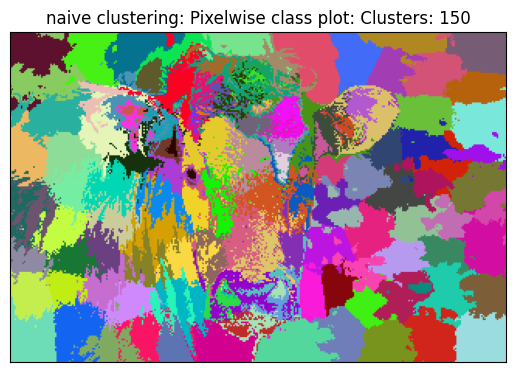

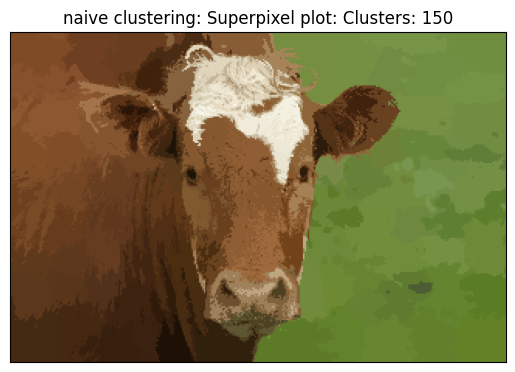

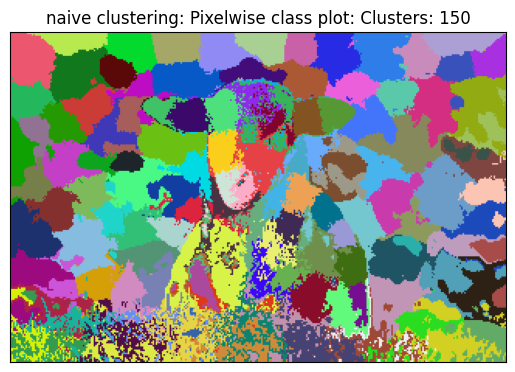

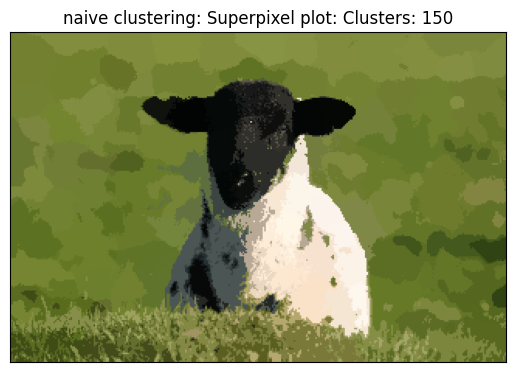

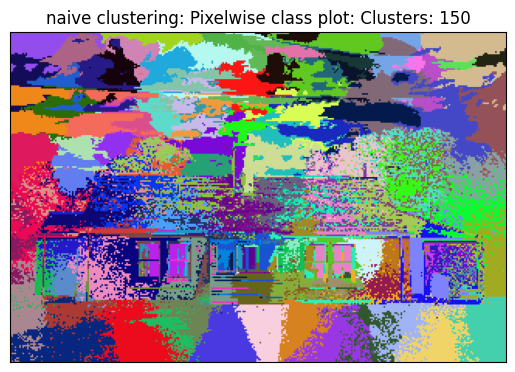

...

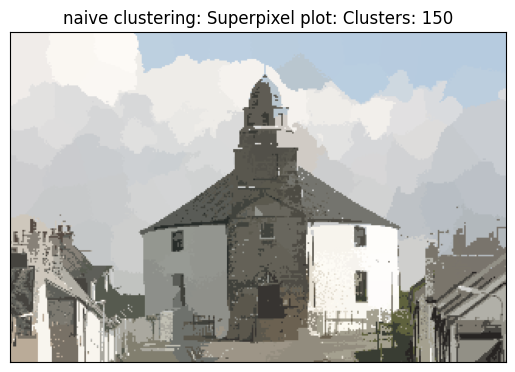

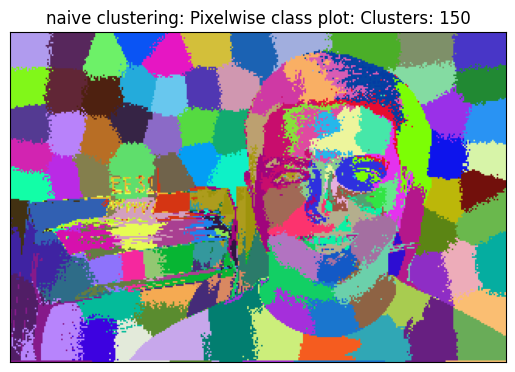

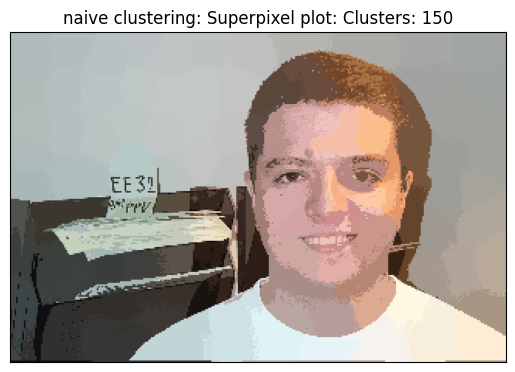

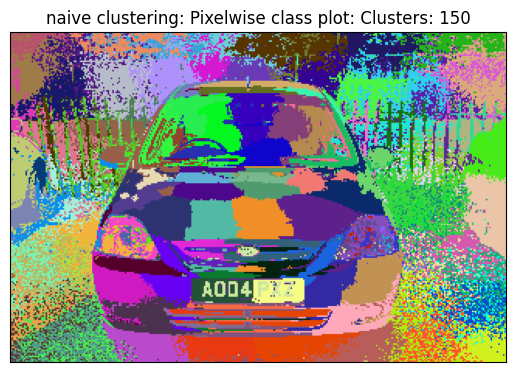

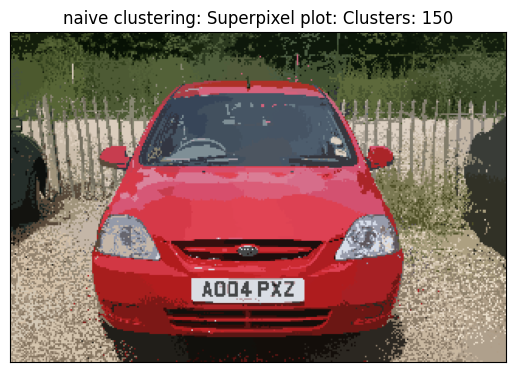

In [6]:
## TODO: Call our plot functions with your SLIC results for all 6 images
n_images = 6
k = 150
for i in im_list[:n_images]:
    im = cv2.imread(i)
    clusters = SLIC(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

.0### Question 3: What advantage did the SLIC give compared to `(r, g, b, x, y)`? Please answer in 3 sentences or fewer. (10 points)

Your Answer:

### Bonus Question 4: Enforce connectivity (20 points, OPTIONAL)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster

Plot results for the 6 images.


## Part 2: Segmentation

For this part, you will use your best superpixels to build an image segmentation system. Alternatively, you can use SLIC from some library, as we demonstrate in the Data section that follows.

### Data

This is mostly the same as the last part, except now we also need to consider the annotated ground truth segmentation maps.

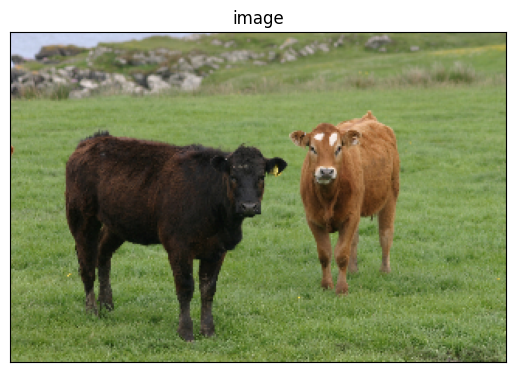

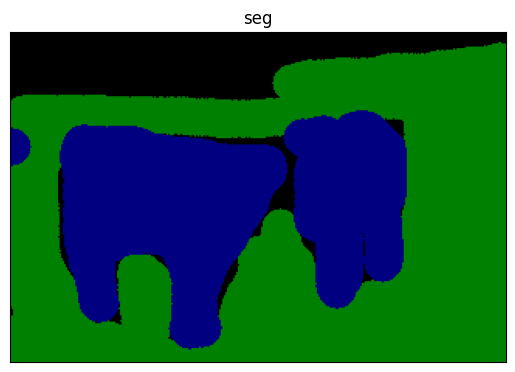

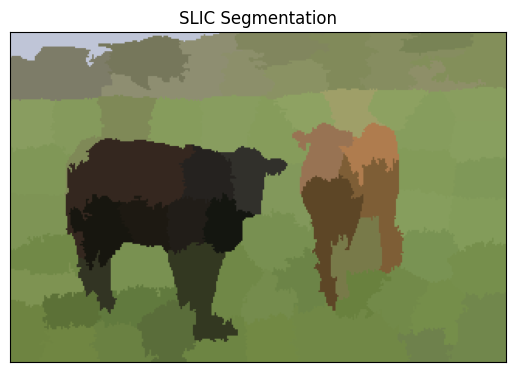

In [ ]:
#  plot a sample image and its ground truth segments
image_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
seg_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
plot_image(image_sample, 'image')
plot_image(seg_sample, 'seg')

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

segments_sample = slic(image_sample, n_segments=100, compactness=10)
superpixel_plot(image_sample, segments_sample, title = "SLIC Segmentation")

In [ ]:
from IPython import embed
import os
current_directory = os.getcwd()
msrc_directory = current_directory + '/MSRC_ObjCategImageDatabase_v1'

#Superpixel dataset preparation

# from Dataset_v1
SEG_LABELS_LIST_v1 = [
    {"id": 9, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 5,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 6, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 7, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 8, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 9, "name": "horse",       "rgb_values": [128,   0,    128]},
    {"id": 9, "name": "water",       "rgb_values": [64,   128,    0]},
    {"id": 9, "name": "mountain",       "rgb_values": [64,   0,    0]},
    {"id": 9, "name": "sheep",       "rgb_values": [0,   128,    128]}]

# from Dataset_v2
SEG_LABELS_LIST_v2 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "horse",      "rgb_values": [128, 0,    128]},
    {"id": 5,  "name": "sheep",      "rgb_values": [0,   128,  128]},
    {"id": 6,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 7,  "name": "mountain",   "rgb_values": [64,  0,    0]},
    {"id": 8,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 9,  "name": "water",      "rgb_values": [64,  128,  0]},
    {"id": 10, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 11, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 12, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 13, "name": "flower",     "rgb_values": [64,  128,  128]},
    {"id": 14, "name": "sign",       "rgb_values": [192, 128,  128]},
    {"id": 15, "name": "bird",       "rgb_values": [0,   64,   0]},
    {"id": 16, "name": "book",       "rgb_values": [128, 64,   0]},
    {"id": 17, "name": "chair",      "rgb_values": [0,   192,  0]},
    {"id": 18, "name": "road",       "rgb_values": [128, 64,   128]},
    {"id": 19, "name": "cat",        "rgb_values": [0,   192,  128]},
    {"id": 20, "name": "dog",        "rgb_values": [128, 192,  128]},
    {"id": 21, "name": "body",       "rgb_values": [64,  64,   0]},
    {"id": 22, "name": "boat",       "rgb_values": [192, 64,   0]}]

# create a map rgb_2_label, where mapping the ground truth 3-d array segmentation into a single ID label.
rgb_2_label = {}
for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']

In [ ]:
msrc_directory

'/content/MSRC_ObjCategImageDatabase_v1'

### Question 5: Superpixel Dataset (30 points)

First, we dilate each superpixel and save the output superpixel patch from SLIC into 224X224 size image (after rescaling), alongwith the ground truth segments label.

For the purpose of consistency, we adopt the existing SLIC implementation from the scikit-learn machine learning package.

Suggested algorithm: Save the superpixels along with their segmentation class. You could implement this as follows:

For each image
1. Get superpixels sp_i for image x. We adopt 100 segments in this assignment, 'segments = slic(image, n_segments=100, compactness=10)'.
2. For every superpixel sp_i in the image, \\
    2.1. find the smallest rectangle which can enclose sp_i <br>
    2.2. Dilate the rectangle by 3 pixels.<br>
    2.3. Get the same region from the segmentation image (from the file with similar name with *_GT). The class for this sp_i is mode of segmentation classes in that same region. Save the dilated region as npy (jpg is lossy for such small patches).<br>


Alternatively, you could create a single csv with columns segment patch location, class label for each sp_i of each image.<br>italicized text

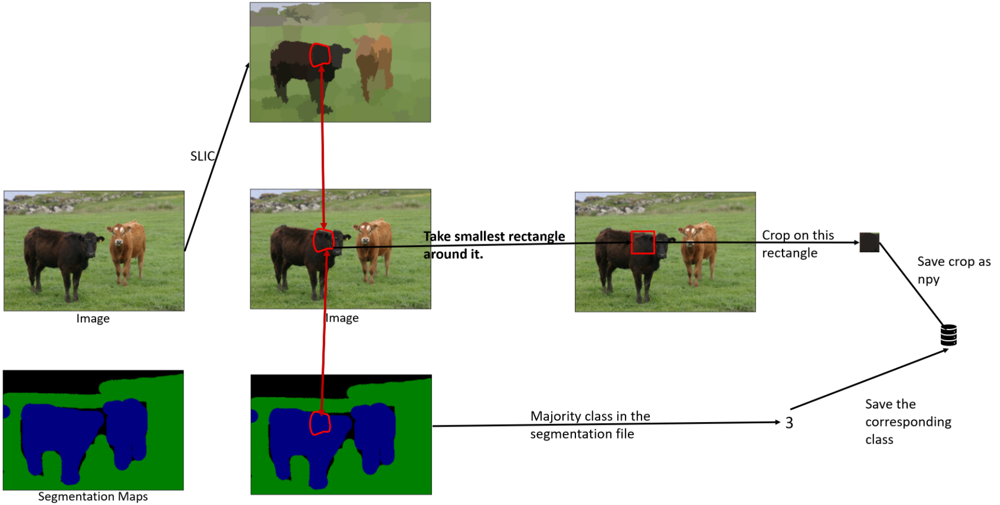


In [ ]:
def convert_seg_to_pixel(im):
  # Convert the ground truth image into a single ID label
  seg_pixel = np.zeros((im.shape[0], im.shape[1]))
  for i in range(im.shape[0]):
    for j in range(im.shape[1]):
        try:
            seg_pixel[i, j] = rgb_2_label[tuple(im[i, j])]
        except:
            seg_pixel[i, j] = -1
  return seg_pixel

In [ ]:
# # Ref: https://stackoverflow.com/questions/40225098/obtain-box2d-from-superpixels-segments
# # Function to convert superpixel segments to rectangular patches
# from skimage.measure import regionprops

# # Function to extract rectangular patches from segments and extract the respective labels
# def extract_labels_from_patch(im, seg):
#     rectanglular_patches = []
#     patch_labels = []
#     for region in regionprops(seg):

#         minr, minc, maxr, maxc = region.bbox
#         # Crop the obtained rectangular patches from the original image and store them in a numpy array
#         rectanglular_patches.append(im[minr:maxr, minc:maxc])
#         # Extract corresponding patches from segmentation map
#         seg_patch = seg[minr:maxr, minc:maxc]
#         # Convert the segmentation map into a single ID label
#         seg_patch_labels = convert_seg_to_pixel(seg_patch)
#         # Extract the most common label from the patch
#         patch_labels.append(np.bincount(seg_patch_labels.astype(int).flatten()).argmax())
#     return rectanglular_patches, patch_labels

In [ ]:
def extract_labels_from_patch(im, seg_gt, superpixel_clusters):
    rectanglular_patches = []
    patch_labels = []

    for i in np.unique(superpixel_clusters):
        # Crop the obtained rectangular patches from the original image and store them in a numpy array
        minr, minc, maxr, maxc = np.where(superpixel_clusters == i)[0].min(), np.where(superpixel_clusters == i)[1].min(), np.where(superpixel_clusters == i)[0].max(), np.where(superpixel_clusters == i)[1].max()
        # print(minr, minc, maxr, maxc)
        # Dilate the rectangular patch by 3 pixels in each direction
        minr = max(0, minr - 3)
        minc = max(0, minc - 3)
        maxr = min(superpixel_clusters.shape[0], maxr + 3)
        maxc = min(superpixel_clusters.shape[1], maxc + 3)
        # print(minr, minc, maxr, maxc)
        # Crop the image
        rectanglular_patches.append(im[minr:maxr, minc:maxc])
        # Extract corresponding patches from segmentation map
        seg_patch = seg_gt[minr:maxr, minc:maxc, :]
        # Convert the segmentation map into a single ID label
        seg_patch_labels = convert_seg_to_pixel(seg_patch)
        # Extract the most common label from the patch
        # Use mode to find the most common value
        patch_labels.append(mode(seg_patch_labels.astype(int).flatten(), keepdims=True)[0][0])
    return rectanglular_patches, patch_labels

In addition to your code, **the primary graded deliverables** for this question are the 12 demo images we request after you have written code for the dataset.

In [ ]:
# !rm -r /content/datasets
# This mounts your Google Drive to the Colab VM.
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!rm -r /content/datasets

In [ ]:
# run SLIC on each original images and save the (segment patch, ID label) pair
# segments = slic(image, n_segments=100, compactness=10)
# it may take up to half an hour to process, depending on the hardware resources
# save the output file names to train.txt
# Alternatively, you don't save the segment patch and ID label offline, instead,
# you process them on the fly later.

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

# Create a directory to store the dataset
!mkdir datasets
# Create a file to store the training data
with open('./datasets/dataset.txt', 'w') as f:
    f.write('')


# Create a tqdm progress bar for the for loop
from tqdm import tqdm
# Find the number of files ending with only .bmp and not _GT.bmp
num_files = len([filename for filename in os.listdir(msrc_directory) if filename.endswith(".bmp") and not filename.endswith("_GT.bmp")])
# Create a tqdm progress bar
pbar = tqdm(total=num_files)

for filename in os.listdir(msrc_directory):
    # Your code
    if filename.endswith(".bmp") and not filename.endswith("_GT.bmp"):
        # Update the progress bar
        pbar.update(1)
        # Print the filename
        print("Processing: " + filename)
        # Read the input image
        print(msrc_directory + '/' + filename)
        img = cv2.imread(msrc_directory + '/' + filename)
        # Read the ground truth image
        print(msrc_directory + '/' + filename[:-4] + '_GT.bmp')
        seg_gt = cv2.imread(msrc_directory + '/' + filename[:-4] + '_GT.bmp')
        seg_gt = cv2.cvtColor(seg_gt,cv2.COLOR_BGR2RGB)
        # Convert the ground truth image into a single ID label
        seg_pixel = convert_seg_to_pixel(seg_gt)
        # Generate the superpixel segmentation using SLIC
        superpixel_clusters = slic(img, n_segments=100, compactness=10)
        # Convert the superpixel segments into rectangulan patches and extract the labels
        patches, labels = extract_labels_from_patch(img, seg_gt, superpixel_clusters)
        # Save each patch as a .npy file and save the corresponding label in train.txt
        for i in range(len(labels)):
            np.save('./datasets/' + filename[:-4] + '_' + str(i) + '.npy', patches[i])
            with open('./datasets/dataset.txt', 'a') as f:
                f.write(filename[:-4] + '_' + str(i) + '.npy' + ' ' + str(labels[i]) + '\n')

# Close the progress bar
pbar.close()


mkdir: cannot create directory ‘datasets’: File exists



  0%|          | 1/240 [03:43<14:50:49, 223.64s/it]

Processing: 2_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_14_s_GT.bmp




  1%|          | 2/240 [00:01<03:08,  1.26it/s]

Processing: 2_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_18_s_GT.bmp



  1%|▏         | 3/240 [00:03<04:10,  1.06s/it]

Processing: 5_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_18_s_GT.bmp



  2%|▏         | 4/240 [00:04<04:37,  1.18s/it]

Processing: 2_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_26_s_GT.bmp



  2%|▏         | 5/240 [00:05<04:49,  1.23s/it]

Processing: 5_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_21_s_GT.bmp



  2%|▎         | 6/240 [00:07<05:09,  1.32s/it]

Processing: 1_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_28_s_GT.bmp



  3%|▎         | 7/240 [00:08<05:24,  1.39s/it]

Processing: 7_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_3_s_GT.bmp



  3%|▎         | 8/240 [00:10<06:09,  1.59s/it]

Processing: 1_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_21_s_GT.bmp



  4%|▍         | 9/240 [00:13<07:24,  1.93s/it]

Processing: 5_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_10_s_GT.bmp



  4%|▍         | 10/240 [00:14<06:53,  1.80s/it]

Processing: 4_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_16_s_GT.bmp



  5%|▍         | 11/240 [00:16<06:23,  1.67s/it]

Processing: 8_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_24_s_GT.bmp



  5%|▌         | 12/240 [00:17<06:09,  1.62s/it]

Processing: 1_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_27_s_GT.bmp



  5%|▌         | 13/240 [00:19<05:54,  1.56s/it]

Processing: 8_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_17_s_GT.bmp



  6%|▌         | 14/240 [00:20<05:48,  1.54s/it]

Processing: 8_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_1_s_GT.bmp



  6%|▋         | 15/240 [00:22<05:38,  1.50s/it]

Processing: 6_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_26_s_GT.bmp



  7%|▋         | 16/240 [00:24<06:02,  1.62s/it]

Processing: 8_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_8_s_GT.bmp



  7%|▋         | 17/240 [00:27<07:30,  2.02s/it]

Processing: 5_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_19_s_GT.bmp



  8%|▊         | 18/240 [00:28<07:01,  1.90s/it]

Processing: 1_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_15_s_GT.bmp



  8%|▊         | 19/240 [00:30<06:24,  1.74s/it]

Processing: 6_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_12_s_GT.bmp



  8%|▊         | 20/240 [00:31<06:05,  1.66s/it]

Processing: 7_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_7_s_GT.bmp



  9%|▉         | 21/240 [00:32<05:51,  1.60s/it]

Processing: 6_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_11_s_GT.bmp



  9%|▉         | 22/240 [00:34<05:38,  1.55s/it]

Processing: 4_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_9_s_GT.bmp



 10%|▉         | 23/240 [00:35<05:25,  1.50s/it]

Processing: 5_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_27_s_GT.bmp



 10%|█         | 24/240 [00:37<05:26,  1.51s/it]

Processing: 5_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_12_s_GT.bmp



 10%|█         | 25/240 [00:40<06:43,  1.88s/it]

Processing: 4_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_18_s_GT.bmp



 11%|█         | 26/240 [00:42<07:43,  2.17s/it]

Processing: 5_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_23_s_GT.bmp



 11%|█▏        | 27/240 [00:45<07:59,  2.25s/it]

Processing: 3_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_24_s_GT.bmp



 12%|█▏        | 28/240 [00:46<07:03,  2.00s/it]

Processing: 1_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_11_s_GT.bmp



 12%|█▏        | 29/240 [00:48<06:24,  1.82s/it]

Processing: 4_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_10_s_GT.bmp



 12%|█▎        | 30/240 [00:49<05:57,  1.70s/it]

Processing: 5_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_3_s_GT.bmp



 13%|█▎        | 31/240 [00:51<05:40,  1.63s/it]

Processing: 8_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_21_s_GT.bmp



 13%|█▎        | 32/240 [00:53<06:10,  1.78s/it]

Processing: 5_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_22_s_GT.bmp



 14%|█▍        | 33/240 [00:55<06:55,  2.01s/it]

Processing: 2_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_7_s_GT.bmp



 14%|█▍        | 34/240 [00:57<06:18,  1.84s/it]

Processing: 7_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_29_s_GT.bmp



 15%|█▍        | 35/240 [00:58<05:54,  1.73s/it]

Processing: 4_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_12_s_GT.bmp



 15%|█▌        | 36/240 [01:00<05:32,  1.63s/it]

Processing: 4_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_5_s_GT.bmp



 15%|█▌        | 37/240 [01:01<05:15,  1.56s/it]

Processing: 3_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_25_s_GT.bmp



 16%|█▌        | 38/240 [01:02<05:07,  1.52s/it]

Processing: 2_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_29_s_GT.bmp



 16%|█▋        | 39/240 [01:04<04:52,  1.46s/it]

Processing: 6_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_3_s_GT.bmp



 17%|█▋        | 40/240 [01:06<05:19,  1.60s/it]

Processing: 1_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_9_s_GT.bmp



 17%|█▋        | 41/240 [01:08<06:27,  1.95s/it]

Processing: 4_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_13_s_GT.bmp



 18%|█▊        | 42/240 [01:10<06:03,  1.83s/it]

Processing: 7_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_4_s_GT.bmp



 18%|█▊        | 43/240 [01:11<05:38,  1.72s/it]

Processing: 6_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_2_s_GT.bmp



 18%|█▊        | 44/240 [01:13<05:26,  1.67s/it]

Processing: 5_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_13_s_GT.bmp



 19%|█▉        | 45/240 [01:14<05:09,  1.59s/it]

Processing: 6_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_19_s_GT.bmp



 19%|█▉        | 46/240 [01:16<04:59,  1.55s/it]

Processing: 6_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_22_s_GT.bmp



 20%|█▉        | 47/240 [01:17<04:54,  1.52s/it]

Processing: 7_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_8_s_GT.bmp



 20%|██        | 48/240 [01:20<05:56,  1.85s/it]

Processing: 1_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_16_s_GT.bmp



 20%|██        | 49/240 [01:23<06:45,  2.12s/it]

Processing: 6_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_13_s_GT.bmp



 21%|██        | 50/240 [01:24<06:12,  1.96s/it]

Processing: 2_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_19_s_GT.bmp



 21%|██▏       | 51/240 [01:26<05:35,  1.78s/it]

Processing: 2_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_8_s_GT.bmp



 22%|██▏       | 52/240 [01:27<05:14,  1.67s/it]

Processing: 7_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_15_s_GT.bmp



 22%|██▏       | 53/240 [01:28<05:00,  1.61s/it]

Processing: 3_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_5_s_GT.bmp



 22%|██▎       | 54/240 [01:30<04:50,  1.56s/it]

Processing: 2_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_20_s_GT.bmp



 23%|██▎       | 55/240 [01:31<04:41,  1.52s/it]

Processing: 1_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_2_s_GT.bmp



 23%|██▎       | 56/240 [01:32<04:19,  1.41s/it]

Processing: 7_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_5_s_GT.bmp



 24%|██▍       | 57/240 [01:36<06:34,  2.16s/it]

Processing: 1_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_4_s_GT.bmp



 24%|██▍       | 58/240 [01:38<06:16,  2.07s/it]

Processing: 6_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_5_s_GT.bmp



 25%|██▍       | 59/240 [01:40<05:43,  1.90s/it]

Processing: 4_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_29_s_GT.bmp



 25%|██▌       | 60/240 [01:41<05:16,  1.76s/it]

Processing: 8_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_20_s_GT.bmp



 25%|██▌       | 61/240 [01:43<04:54,  1.65s/it]

Processing: 3_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_28_s_GT.bmp



 26%|██▌       | 62/240 [01:44<04:41,  1.58s/it]

Processing: 8_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_27_s_GT.bmp



 26%|██▋       | 63/240 [01:45<04:32,  1.54s/it]

Processing: 5_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_16_s_GT.bmp



 27%|██▋       | 64/240 [01:47<04:28,  1.52s/it]

Processing: 6_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_1_s_GT.bmp



 27%|██▋       | 65/240 [01:50<05:49,  2.00s/it]

Processing: 3_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_6_s_GT.bmp



 28%|██▊       | 66/240 [01:52<05:34,  1.92s/it]

Processing: 1_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_24_s_GT.bmp



 28%|██▊       | 67/240 [01:53<05:05,  1.77s/it]

Processing: 5_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_26_s_GT.bmp



 28%|██▊       | 68/240 [01:55<04:47,  1.67s/it]

Processing: 5_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_17_s_GT.bmp



 29%|██▉       | 69/240 [01:56<04:38,  1.63s/it]

Processing: 3_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_13_s_GT.bmp



 29%|██▉       | 70/240 [01:58<04:24,  1.56s/it]

Processing: 2_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_3_s_GT.bmp



 30%|██▉       | 71/240 [01:59<04:18,  1.53s/it]

Processing: 4_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_2_s_GT.bmp



 30%|███       | 72/240 [02:00<04:08,  1.48s/it]

Processing: 1_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_18_s_GT.bmp



 30%|███       | 73/240 [02:03<04:57,  1.78s/it]

Processing: 2_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_17_s_GT.bmp



 31%|███       | 74/240 [02:05<05:14,  1.89s/it]

Processing: 3_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_2_s_GT.bmp



 31%|███▏      | 75/240 [02:06<04:52,  1.77s/it]

Processing: 1_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_7_s_GT.bmp



 32%|███▏      | 76/240 [02:08<04:30,  1.65s/it]

Processing: 7_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_27_s_GT.bmp



 32%|███▏      | 77/240 [02:09<04:23,  1.61s/it]

Processing: 4_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_7_s_GT.bmp



 32%|███▎      | 78/240 [02:11<04:11,  1.55s/it]

Processing: 1_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_23_s_GT.bmp



 33%|███▎      | 79/240 [02:12<04:03,  1.51s/it]

Processing: 8_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_7_s_GT.bmp



 33%|███▎      | 80/240 [02:14<04:04,  1.53s/it]

Processing: 3_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_12_s_GT.bmp



 34%|███▍      | 81/240 [02:16<04:27,  1.68s/it]

Processing: 6_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_6_s_GT.bmp



 34%|███▍      | 82/240 [02:19<05:17,  2.01s/it]

Processing: 2_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_25_s_GT.bmp



 35%|███▍      | 83/240 [02:20<04:46,  1.83s/it]

Processing: 1_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_8_s_GT.bmp



 35%|███▌      | 84/240 [02:21<04:25,  1.70s/it]

Processing: 3_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_18_s_GT.bmp



 35%|███▌      | 85/240 [02:23<04:13,  1.64s/it]

Processing: 8_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_23_s_GT.bmp



 36%|███▌      | 86/240 [02:24<04:03,  1.58s/it]

Processing: 3_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_15_s_GT.bmp



 36%|███▋      | 87/240 [02:26<03:57,  1.55s/it]

Processing: 6_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_15_s_GT.bmp



 37%|███▋      | 88/240 [02:27<03:54,  1.55s/it]

Processing: 6_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_30_s_GT.bmp



 37%|███▋      | 89/240 [02:29<04:07,  1.64s/it]

Processing: 5_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_6_s_GT.bmp



 38%|███▊      | 90/240 [02:32<04:58,  1.99s/it]

Processing: 1_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_1_s_GT.bmp



 38%|███▊      | 91/240 [02:34<04:35,  1.85s/it]

Processing: 5_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_24_s_GT.bmp



 38%|███▊      | 92/240 [02:35<04:17,  1.74s/it]

Processing: 8_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_28_s_GT.bmp



 39%|███▉      | 93/240 [02:36<04:00,  1.64s/it]

Processing: 2_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_1_s_GT.bmp



 39%|███▉      | 94/240 [02:38<03:46,  1.55s/it]

Processing: 4_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_14_s_GT.bmp



 40%|███▉      | 95/240 [02:39<03:37,  1.50s/it]

Processing: 2_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_4_s_GT.bmp



 40%|████      | 96/240 [02:41<03:36,  1.50s/it]

Processing: 6_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_24_s_GT.bmp



 40%|████      | 97/240 [02:42<03:34,  1.50s/it]

Processing: 7_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_22_s_GT.bmp



 41%|████      | 98/240 [02:45<04:15,  1.80s/it]

Processing: 8_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_3_s_GT.bmp



 41%|████▏     | 99/240 [02:47<04:30,  1.92s/it]

Processing: 4_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_28_s_GT.bmp



 42%|████▏     | 100/240 [02:48<04:05,  1.75s/it]

Processing: 1_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_30_s_GT.bmp



 42%|████▏     | 101/240 [02:50<03:47,  1.64s/it]

Processing: 5_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_7_s_GT.bmp



 42%|████▎     | 102/240 [02:51<03:41,  1.60s/it]

Processing: 5_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_8_s_GT.bmp



 43%|████▎     | 103/240 [02:53<03:31,  1.54s/it]

Processing: 5_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_1_s_GT.bmp



 43%|████▎     | 104/240 [02:54<03:25,  1.51s/it]

Processing: 8_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_5_s_GT.bmp



 44%|████▍     | 105/240 [02:55<03:23,  1.50s/it]

Processing: 8_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_19_s_GT.bmp



 44%|████▍     | 106/240 [02:58<03:47,  1.70s/it]

Processing: 8_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_10_s_GT.bmp



 45%|████▍     | 107/240 [03:00<04:17,  1.94s/it]

Processing: 5_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_30_s_GT.bmp



 45%|████▌     | 108/240 [03:01<03:54,  1.77s/it]

Processing: 4_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_26_s_GT.bmp



 45%|████▌     | 109/240 [03:03<03:35,  1.64s/it]

Processing: 7_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_19_s_GT.bmp



 46%|████▌     | 110/240 [03:04<03:27,  1.60s/it]

Processing: 6_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_28_s_GT.bmp



 46%|████▋     | 111/240 [03:06<03:23,  1.58s/it]

Processing: 6_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_20_s_GT.bmp



 47%|████▋     | 112/240 [03:07<03:21,  1.58s/it]

Processing: 4_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_11_s_GT.bmp



 47%|████▋     | 113/240 [03:09<03:13,  1.53s/it]

Processing: 6_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_23_s_GT.bmp



 48%|████▊     | 114/240 [03:11<03:23,  1.62s/it]

Processing: 6_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_10_s_GT.bmp



 48%|████▊     | 115/240 [03:13<04:05,  1.96s/it]

Processing: 2_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_13_s_GT.bmp



 48%|████▊     | 116/240 [03:15<03:44,  1.81s/it]

Processing: 7_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_21_s_GT.bmp



 49%|████▉     | 117/240 [03:16<03:28,  1.70s/it]

Processing: 3_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_3_s_GT.bmp



 49%|████▉     | 118/240 [03:18<03:22,  1.66s/it]

Processing: 7_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_20_s_GT.bmp



 50%|████▉     | 119/240 [03:20<03:51,  1.91s/it]

Processing: 4_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_17_s_GT.bmp



 50%|█████     | 120/240 [03:22<03:35,  1.80s/it]

Processing: 4_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_27_s_GT.bmp



 50%|█████     | 121/240 [03:23<03:22,  1.70s/it]

Processing: 2_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_23_s_GT.bmp



 51%|█████     | 122/240 [03:26<03:44,  1.90s/it]

Processing: 4_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_8_s_GT.bmp



 51%|█████▏    | 123/240 [03:28<03:56,  2.02s/it]

Processing: 5_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_28_s_GT.bmp



 52%|█████▏    | 124/240 [03:29<03:32,  1.83s/it]

Processing: 4_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_3_s_GT.bmp



 52%|█████▏    | 125/240 [03:31<03:13,  1.68s/it]

Processing: 6_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_17_s_GT.bmp



 52%|█████▎    | 126/240 [03:32<03:05,  1.62s/it]

Processing: 4_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_22_s_GT.bmp



 53%|█████▎    | 127/240 [03:34<02:54,  1.54s/it]

Processing: 1_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_29_s_GT.bmp



 53%|█████▎    | 128/240 [03:35<02:47,  1.49s/it]

Processing: 5_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_5_s_GT.bmp



 54%|█████▍    | 129/240 [03:36<02:42,  1.47s/it]

Processing: 1_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp



 54%|█████▍    | 130/240 [03:38<02:47,  1.52s/it]

Processing: 4_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_15_s_GT.bmp



 55%|█████▍    | 131/240 [03:41<03:21,  1.85s/it]

Processing: 2_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_27_s_GT.bmp



 55%|█████▌    | 132/240 [03:42<03:14,  1.80s/it]

Processing: 2_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_9_s_GT.bmp



 55%|█████▌    | 133/240 [03:44<02:58,  1.67s/it]

Processing: 5_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_11_s_GT.bmp



 56%|█████▌    | 134/240 [03:45<02:47,  1.58s/it]

Processing: 7_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_28_s_GT.bmp



 56%|█████▋    | 135/240 [03:47<02:43,  1.55s/it]

Processing: 8_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_25_s_GT.bmp



 57%|█████▋    | 136/240 [03:48<02:41,  1.56s/it]

Processing: 7_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_24_s_GT.bmp



 57%|█████▋    | 137/240 [03:50<02:39,  1.55s/it]

Processing: 1_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_25_s_GT.bmp



 57%|█████▊    | 138/240 [03:51<02:34,  1.51s/it]

Processing: 7_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_17_s_GT.bmp



 58%|█████▊    | 139/240 [03:54<03:06,  1.85s/it]

Processing: 3_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_7_s_GT.bmp



 58%|█████▊    | 140/240 [03:56<03:14,  1.95s/it]

Processing: 1_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_26_s_GT.bmp



 59%|█████▉    | 141/240 [03:58<03:13,  1.96s/it]

Processing: 4_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_21_s_GT.bmp



 59%|█████▉    | 142/240 [04:01<03:31,  2.16s/it]

Processing: 7_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_6_s_GT.bmp



 60%|█████▉    | 143/240 [04:02<03:07,  1.94s/it]

Processing: 2_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_11_s_GT.bmp



 60%|██████    | 144/240 [04:03<02:48,  1.76s/it]

Processing: 7_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_10_s_GT.bmp



 60%|██████    | 145/240 [04:05<02:37,  1.66s/it]

Processing: 6_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_29_s_GT.bmp



 61%|██████    | 146/240 [04:07<02:55,  1.87s/it]

Processing: 7_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_18_s_GT.bmp



 61%|██████▏   | 147/240 [04:10<03:10,  2.05s/it]

Processing: 5_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_29_s_GT.bmp



 62%|██████▏   | 148/240 [04:11<02:52,  1.88s/it]

Processing: 2_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_30_s_GT.bmp



 62%|██████▏   | 149/240 [04:12<02:36,  1.72s/it]

Processing: 3_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_11_s_GT.bmp



 62%|██████▎   | 150/240 [04:14<02:26,  1.62s/it]

Processing: 4_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_1_s_GT.bmp



 63%|██████▎   | 151/240 [04:15<02:18,  1.56s/it]

Processing: 3_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_14_s_GT.bmp



 63%|██████▎   | 152/240 [04:17<02:13,  1.52s/it]

Processing: 1_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_13_s_GT.bmp



 64%|██████▍   | 153/240 [04:18<02:11,  1.51s/it]

Processing: 8_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_18_s_GT.bmp



 64%|██████▍   | 154/240 [04:20<02:16,  1.59s/it]

Processing: 3_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_23_s_GT.bmp



 65%|██████▍   | 155/240 [04:22<02:41,  1.90s/it]

Processing: 3_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_20_s_GT.bmp



 65%|██████▌   | 156/240 [04:24<02:30,  1.79s/it]

Processing: 4_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_4_s_GT.bmp



 65%|██████▌   | 157/240 [04:25<02:18,  1.67s/it]

Processing: 4_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_19_s_GT.bmp



 66%|██████▌   | 158/240 [04:27<02:09,  1.58s/it]

Processing: 6_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_16_s_GT.bmp



 66%|██████▋   | 159/240 [04:28<02:04,  1.53s/it]

Processing: 1_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_14_s_GT.bmp



 67%|██████▋   | 160/240 [04:30<01:59,  1.50s/it]

Processing: 5_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_20_s_GT.bmp



 67%|██████▋   | 161/240 [04:31<01:55,  1.47s/it]

Processing: 4_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_20_s_GT.bmp



 68%|██████▊   | 162/240 [04:32<01:53,  1.45s/it]

Processing: 5_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_14_s_GT.bmp



 68%|██████▊   | 163/240 [04:35<02:10,  1.70s/it]

Processing: 6_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_9_s_GT.bmp



 68%|██████▊   | 164/240 [04:37<02:26,  1.93s/it]

Processing: 2_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_12_s_GT.bmp



 69%|██████▉   | 165/240 [04:38<02:10,  1.74s/it]

Processing: 7_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_9_s_GT.bmp



 69%|██████▉   | 166/240 [04:40<02:01,  1.64s/it]

Processing: 8_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_13_s_GT.bmp



 70%|██████▉   | 167/240 [04:41<01:56,  1.59s/it]

Processing: 8_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_6_s_GT.bmp



 70%|███████   | 168/240 [04:43<01:52,  1.57s/it]

Processing: 6_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_25_s_GT.bmp



 70%|███████   | 169/240 [04:44<01:50,  1.56s/it]

Processing: 3_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_29_s_GT.bmp



 71%|███████   | 170/240 [04:46<01:46,  1.53s/it]

Processing: 3_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_16_s_GT.bmp



 71%|███████▏  | 171/240 [04:48<01:55,  1.67s/it]

Processing: 1_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_20_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_20_s_GT.bmp



 72%|███████▏  | 172/240 [04:51<02:15,  1.99s/it]

Processing: 7_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_16_s_GT.bmp



 72%|███████▏  | 173/240 [04:52<02:04,  1.86s/it]

Processing: 2_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_6_s_GT.bmp



 72%|███████▎  | 174/240 [04:54<01:53,  1.72s/it]

Processing: 2_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_28_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_28_s_GT.bmp



 73%|███████▎  | 175/240 [04:55<01:45,  1.63s/it]

Processing: 7_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_1_s_GT.bmp



 73%|███████▎  | 176/240 [04:56<01:40,  1.57s/it]

Processing: 4_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_25_s_GT.bmp



 74%|███████▍  | 177/240 [04:58<01:34,  1.51s/it]

Processing: 4_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_24_s_GT.bmp



 74%|███████▍  | 178/240 [04:59<01:32,  1.48s/it]

Processing: 8_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_30_s_GT.bmp



 75%|███████▍  | 179/240 [05:01<01:29,  1.47s/it]

Processing: 6_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_7_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_7_s_GT.bmp



 75%|███████▌  | 180/240 [05:03<01:51,  1.86s/it]

Processing: 1_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_10_s_GT.bmp



 75%|███████▌  | 181/240 [05:05<01:51,  1.89s/it]

Processing: 1_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_6_s_GT.bmp



 76%|███████▌  | 182/240 [05:07<01:42,  1.76s/it]

Processing: 6_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_21_s_GT.bmp



 76%|███████▋  | 183/240 [05:08<01:37,  1.71s/it]

Processing: 6_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_14_s_GT.bmp



 77%|███████▋  | 184/240 [05:10<01:32,  1.66s/it]

Processing: 8_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_16_s_GT.bmp



 77%|███████▋  | 185/240 [05:11<01:27,  1.59s/it]

Processing: 8_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_26_s_GT.bmp



 78%|███████▊  | 186/240 [05:13<01:24,  1.56s/it]

Processing: 7_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_11_s_GT.bmp



 78%|███████▊  | 187/240 [05:14<01:22,  1.56s/it]

Processing: 1_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_22_s_GT.bmp



 78%|███████▊  | 188/240 [05:17<01:35,  1.84s/it]

Processing: 3_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_17_s_GT.bmp



 79%|███████▉  | 189/240 [05:19<01:37,  1.92s/it]

Processing: 5_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_2_s_GT.bmp



 79%|███████▉  | 190/240 [05:21<01:30,  1.80s/it]

Processing: 2_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_2_s_GT.bmp



 80%|███████▉  | 191/240 [05:22<01:22,  1.68s/it]

Processing: 6_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_18_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_18_s_GT.bmp



 80%|████████  | 192/240 [05:23<01:18,  1.63s/it]

Processing: 3_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_8_s_GT.bmp



 80%|████████  | 193/240 [05:26<01:26,  1.85s/it]

Processing: 1_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_3_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_3_s_GT.bmp



 81%|████████  | 194/240 [05:28<01:26,  1.87s/it]

Processing: 8_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_9_s_GT.bmp



 81%|████████▏ | 195/240 [05:30<01:28,  1.97s/it]

Processing: 8_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_14_s_GT.bmp



 82%|████████▏ | 196/240 [05:33<01:34,  2.16s/it]

Processing: 8_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_15_s_GT.bmp



 82%|████████▏ | 197/240 [05:34<01:23,  1.94s/it]

Processing: 8_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_29_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_29_s_GT.bmp



 82%|████████▎ | 198/240 [05:35<01:15,  1.80s/it]

Processing: 2_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_15_s_GT.bmp



 83%|████████▎ | 199/240 [05:37<01:08,  1.67s/it]

Processing: 2_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_5_s_GT.bmp



 83%|████████▎ | 200/240 [05:38<01:04,  1.60s/it]

Processing: 5_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_25_s_GT.bmp



 84%|████████▍ | 201/240 [05:40<01:00,  1.55s/it]

Processing: 3_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_26_s_GT.bmp



 84%|████████▍ | 202/240 [05:41<00:56,  1.50s/it]

Processing: 2_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_22_s_GT.bmp



 85%|████████▍ | 203/240 [05:42<00:54,  1.46s/it]

Processing: 1_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_12_s_GT.bmp



 85%|████████▌ | 204/240 [05:45<01:06,  1.84s/it]

Processing: 3_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_21_s_GT.bmp



 85%|████████▌ | 205/240 [05:47<01:06,  1.89s/it]

Processing: 8_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_11_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_11_s_GT.bmp



 86%|████████▌ | 206/240 [05:49<01:00,  1.78s/it]

Processing: 2_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_21_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_21_s_GT.bmp



 86%|████████▋ | 207/240 [05:50<00:55,  1.67s/it]

Processing: 7_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_26_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_26_s_GT.bmp



 87%|████████▋ | 208/240 [05:51<00:50,  1.59s/it]

Processing: 4_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_6_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_6_s_GT.bmp



 87%|████████▋ | 209/240 [05:53<00:47,  1.52s/it]

Processing: 3_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_19_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_19_s_GT.bmp



 88%|████████▊ | 210/240 [05:54<00:44,  1.49s/it]

Processing: 6_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_27_s_GT.bmp



 88%|████████▊ | 211/240 [05:56<00:44,  1.52s/it]

Processing: 5_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_4_s_GT.bmp



 88%|████████▊ | 212/240 [05:58<00:50,  1.80s/it]

Processing: 7_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_23_s_GT.bmp



 89%|████████▉ | 213/240 [06:01<00:52,  1.96s/it]

Processing: 7_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_13_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_13_s_GT.bmp



 89%|████████▉ | 214/240 [06:02<00:47,  1.82s/it]

Processing: 3_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_27_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_27_s_GT.bmp



 90%|████████▉ | 215/240 [06:04<00:42,  1.69s/it]

Processing: 6_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_4_s_GT.bmp



 90%|█████████ | 216/240 [06:05<00:38,  1.62s/it]

Processing: 7_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_25_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_25_s_GT.bmp



 90%|█████████ | 217/240 [06:07<00:36,  1.60s/it]

Processing: 8_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_4_s_GT.bmp



 91%|█████████ | 218/240 [06:08<00:33,  1.54s/it]

Processing: 5_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_9_s_GT.bmp



 91%|█████████▏| 219/240 [06:09<00:31,  1.50s/it]

Processing: 8_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_12_s_GT.bmp



 92%|█████████▏| 220/240 [06:11<00:32,  1.64s/it]

Processing: 7_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_12_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_12_s_GT.bmp



 92%|█████████▏| 221/240 [06:14<00:37,  1.98s/it]

Processing: 7_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_30_s_GT.bmp



 92%|█████████▎| 222/240 [06:16<00:33,  1.84s/it]

Processing: 4_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_30_s_GT.bmp



 93%|█████████▎| 223/240 [06:17<00:29,  1.71s/it]

Processing: 7_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_2_s_GT.bmp



 93%|█████████▎| 224/240 [06:19<00:26,  1.65s/it]

Processing: 3_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_4_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_4_s_GT.bmp



 94%|█████████▍| 225/240 [06:20<00:24,  1.62s/it]

Processing: 1_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_5_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_5_s_GT.bmp



 94%|█████████▍| 226/240 [06:22<00:22,  1.58s/it]

Processing: 8_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_2_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_2_s_GT.bmp



 95%|█████████▍| 227/240 [06:23<00:20,  1.57s/it]

Processing: 3_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_10_s_GT.bmp



 95%|█████████▌| 228/240 [06:25<00:18,  1.58s/it]

Processing: 7_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_14_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/7_14_s_GT.bmp



 95%|█████████▌| 229/240 [06:28<00:21,  1.96s/it]

Processing: 3_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_30_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_30_s_GT.bmp



 96%|█████████▌| 230/240 [06:29<00:18,  1.87s/it]

Processing: 4_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_23_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/4_23_s_GT.bmp



 96%|█████████▋| 231/240 [06:31<00:15,  1.73s/it]

Processing: 2_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_24_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_24_s_GT.bmp



 97%|█████████▋| 232/240 [06:32<00:13,  1.66s/it]

Processing: 6_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_8_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/6_8_s_GT.bmp



 97%|█████████▋| 233/240 [06:34<00:11,  1.62s/it]

Processing: 2_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_16_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_16_s_GT.bmp



 98%|█████████▊| 234/240 [06:35<00:09,  1.54s/it]

Processing: 1_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_17_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/1_17_s_GT.bmp



 98%|█████████▊| 235/240 [06:36<00:07,  1.50s/it]

Processing: 2_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_10_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/2_10_s_GT.bmp



 98%|█████████▊| 236/240 [06:38<00:05,  1.46s/it]

Processing: 5_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_15_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/5_15_s_GT.bmp



 99%|█████████▉| 237/240 [06:40<00:05,  1.77s/it]

Processing: 3_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_22_s_GT.bmp



 99%|█████████▉| 238/240 [06:42<00:03,  1.89s/it]

Processing: 8_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_22_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/8_22_s_GT.bmp



100%|█████████▉| 239/240 [06:44<00:01,  1.75s/it]

Processing: 3_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_9_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_9_s_GT.bmp



100%|██████████| 240/240 [06:45<00:00,  1.63s/it]

Processing: 3_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_1_s.bmp
/content/MSRC_ObjCategImageDatabase_v1/3_1_s_GT.bmp


100%|██████████| 240/240 [06:47<00:00,  1.70s/it]


In [ ]:
import shutil

# Zip the dataset folder and store it in the drive
!zip -r datasets.zip datasets
# If the zip file is not present in the current directory, save it in the current directory
path = '/content/drive/MyDrive/Coursework/Fall 2023/CMSC 828I/HW1/datasets.zip'
shutil.copy('/content/datasets.zip', path)

Streaming output truncated to the last 5000 lines.
  adding: datasets/4_1_s_1.npy (deflated 52%)
  adding: datasets/7_11_s_16.npy (deflated 27%)
  adding: datasets/6_13_s_0.npy (deflated 31%)
  adding: datasets/8_22_s_45.npy (deflated 13%)
  adding: datasets/3_16_s_6.npy (deflated 50%)
  adding: datasets/3_2_s_1.npy (deflated 53%)
  adding: datasets/4_7_s_39.npy (deflated 38%)
  adding: datasets/4_23_s_47.npy (deflated 15%)
  adding: datasets/4_8_s_15.npy (deflated 39%)
  adding: datasets/3_4_s_2.npy (deflated 41%)
  adding: datasets/3_28_s_23.npy (deflated 11%)
  adding: datasets/2_13_s_24.npy (deflated 59%)
  adding: datasets/1_21_s_16.npy (deflated 40%)
  adding: datasets/1_28_s_27.npy (deflated 11%)
  adding: datasets/4_26_s_79.npy (deflated 18%)
  adding: datasets/5_29_s_35.npy (deflated 13%)
  adding: datasets/5_20_s_14.npy (deflated 30%)
  adding: datasets/8_20_s_23.npy (deflated 7%)
  adding: datasets/2_8_s_38.npy (deflated 9%)
  adding: datasets/5_23_s_37.npy (deflated 8%)
  a

'/content/drive/MyDrive/Coursework/Fall 2023/CMSC 828I/HW1/datasets.zip'

In [ ]:
def train_test_splitter(train_split):
    # Read the dataset.txt file and split it into two files: train.txt and test.txt such that the ratio of train to val is 80:20
    # Create a file to store the training data
    train_split = train_split
    with open('./datasets/train.txt', 'w') as f:
        f.write('')
    # Create a file to store the validation data
    with open('./datasets/test.txt', 'w') as f:
        f.write('')
    # Open the dataset.txt file
    with open('./datasets/dataset.txt', 'r') as f:
        # Read the lines
        lines = f.readlines()
        # Shuffle the lines
        random.shuffle(lines)
        # Find the number of lines
        num_lines = len(lines)
        # Find the index to split the lines into train and val
        split_index = int(train_split * num_lines)
        # Write the first 80% of the lines into train.txt
        with open('./datasets/train.txt', 'a') as f1:
            for line in lines[:split_index]:
                f1.write(line)
        # Write the last 20% of the lines into val.txt
        with open('./datasets/test.txt', 'a') as f2:
            for line in lines[split_index:]:
                f2.write(line)

In [ ]:
# Unzip the file from drive to colab /content folder
!unzip -qq /content/drive/MyDrive/Coursework/Fall\ 2023/CMSC\ 828I/HW1/datasets.zip

In [ ]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image
from torchvision import transforms
import pickle as pickle
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F


if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"Pytorch version: {torch.__version__}")
    print(f"Device name: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("No GPU available.")

# -------------
# Dataset class
# -------------
#
# ``torch.utils.data.Dataset`` is an abstract class representing a
# dataset.
# Your custom dataset should inherit ``Dataset`` and override the following
# methods:
#
# -  ``__len__`` so that ``len(dataset)`` returns the size of the dataset.
# -  ``__getitem__`` to support the indexing such that ``dataset[i]`` can
#    be used to get sp_i sample
#
# Let's create a dataset class for our superpixel dataset. We will
# read the csv in ``__init__`` but leave the reading of images to
# ``__getitem__``. This is memory efficient because all the images are not
# stored in the memory at once but read as required.
#
# Sample of our dataset will be a dict
# ``{'superpixel image': image, 'superpixel class': class}``. Our dataset will take an
# optional argument ``transform`` so that any required processing can be
# applied on the sample. Remember to resize the image using ``transform``.

class SegmentationData(data.Dataset):

    def __init__(self, transform=None, path='./datasets', train=True):
        # Your code
        self.transform = transform
        self.path = path
        self.train = train
        self.data = []
        self.targets = []
        # Read the train.txt or test.txt file
        if self.train:
            with open(self.path + '/train.txt', 'r') as f:
                lines = f.readlines()
        else:
            with open(self.path + '/test.txt', 'r') as f:
                lines = f.readlines()
        # Iterate through the lines
        for line in lines:
            # Read the image name and label
            image_name, label = line.split()
            # Append the image name and label to the data and targets lists
            self.data.append(image_name)
            self.targets.append(int(label))
        # Convert the lists into numpy arrays
        self.data = np.array(self.data)
        self.targets = np.array(self.targets)

    def __getitem__(self, index):
        # Your code
        # Read the image
        image = np.load(self.path + '/' + self.data[index])
        # Read the label
        label = self.targets[index]
        # Convert the image into a PIL image
        image = Image.fromarray(image)
        # Apply the transform
        if self.transform is not None:
            image = self.transform(image)
        # Return the image and the label as a dictionary entry
        return {'superpixel image': image, 'superpixel class': label}

    def __len__(self):
        # Your code
        return len(self.data)



Pytorch version: 2.0.1+cu118
Device name: Tesla T4


Show some outputs! Choose 1 image. For that image, plot the image, along with the superpixel map for the image, as you did for Assignment 1. Then, show the first 10 superpixel patches for the image, retrieved from your dataset.

The output for this portion will be 12 images, displayed below your code below.

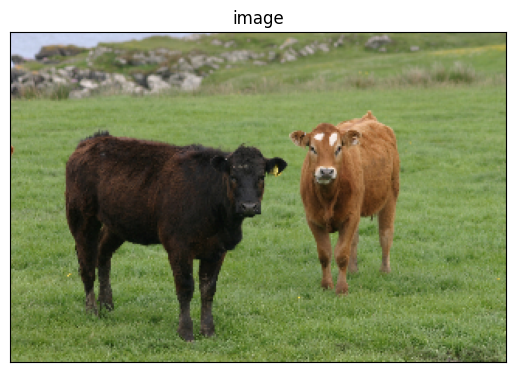

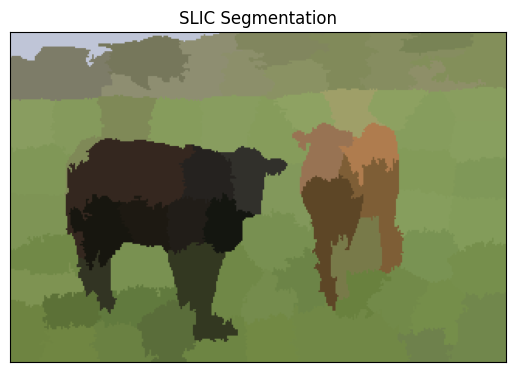

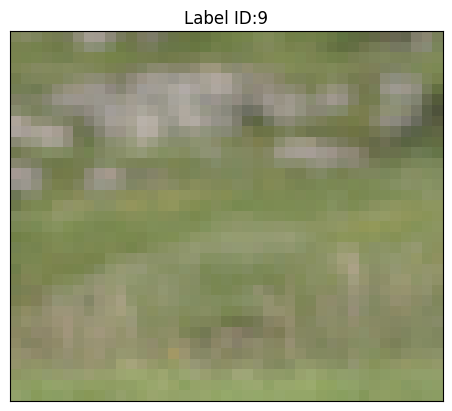

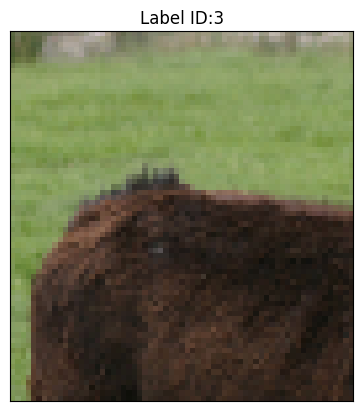

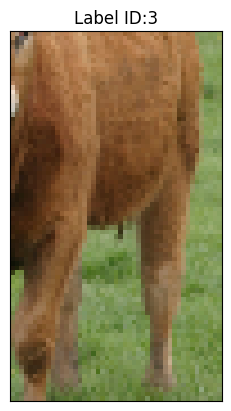

...

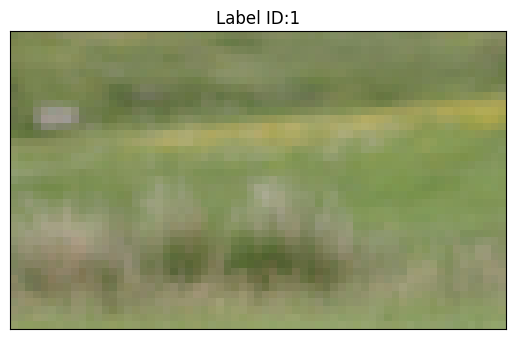

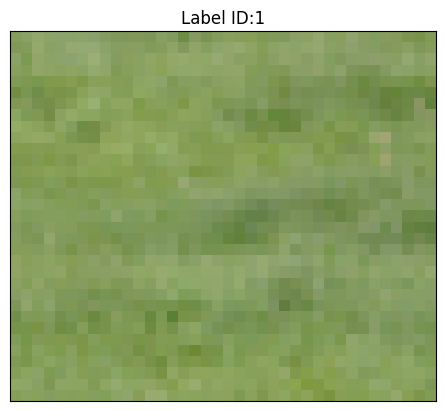

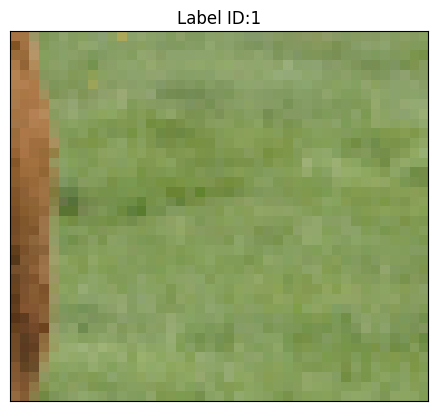

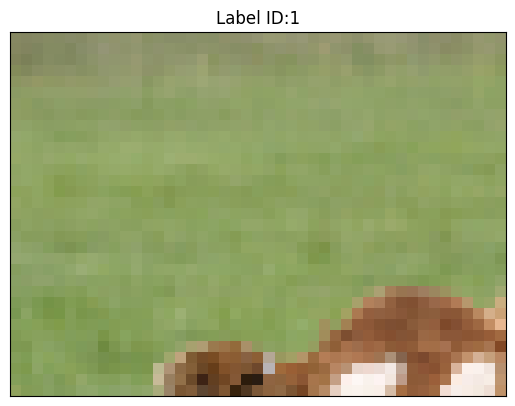

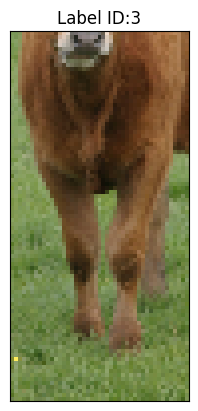

In [ ]:
# Read the input image
img = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
# Read the ground truth image
seg_gt = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
seg_gt_rgb = cv2.cvtColor(seg_gt,cv2.COLOR_BGR2RGB)
# Convert the ground truth image into a single ID label
seg_pixel = convert_seg_to_pixel(seg_gt)
# # Plot the input image and its ground truth segmentation
plot_image(img, 'image')
# plot_image(seg_gt, 'seg')
# # Generate the superpixel segmentation using SLIC
superpixel_clusters = slic(img, n_segments=100, compactness=10)
# # Plot the superpixel segmentation
superpixel_plot(img, superpixel_clusters, title = "SLIC Segmentation")
# # Convert the superpixel segments into rectangulan patches and extract the labels
patches, labels = extract_labels_from_patch(img, seg_gt_rgb, superpixel_clusters)
import random
# Display the patches and their labels
for i in random.sample(list(range(0,len(labels))), 10):
    plot_image(patches[i], "Label ID:"+str(labels[i]))


In [ ]:
### YOUR CODE TO PLOT 12 images (original RGB + superpixel map + first 10 superpixels) ###
# # Create a dataset object
# dataset = SegmentationData(transform=transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()]), path='./datasets')
# # Create a dataloader object
# dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
# # Create an iterator object
# iterator = iter(dataloader)
# # Get the first batch
# batch = next(iterator)
# # Get the first image and its label
# image = batch['superpixel image']
# label = batch['superpixel class']
# # Plot the image
# plot_image(image[0].numpy().transpose(1, 2, 0), 'image')
# # Plot the superpixel map
# superpixel_map = SLIC(image[0].numpy().transpose(1, 2, 0), 100)
# superpixel_plot(image[0].numpy().transpose(1, 2, 0), superpixel_map, title = "SLIC Segmentation")
# # Plot the first 10 superpixels
# for i in np.unique(superpixel_map)[:10]:
#     plot_image(image[0].numpy().transpose(1, 2, 0) * (superpixel_map == i).reshape(224, 224, 1), "Superpixel " + str(i))


### Question 6: Deep Network (10 points)

You could use a pre-trained network (like VGG) and replace the last few layers with a fully connected layer.

In [ ]:
# Model definition
class SegmentationNN(nn.Module):
    def __init__(self):
        super(SegmentationNN, self).__init__()
        # Your code
        # Define the layers
        base_model = models.vgg16(pretrained=True)
        for param in base_model.parameters():
            param.requires_grad = False
        base_model.classifier = nn.Sequential(nn.Linear(25088, 4096),
                                              nn.ReLU(),
                                              nn.Dropout(0.5),
                                              nn.Linear(4096, 1024),
                                              nn.ReLU(),
                                              nn.Dropout(0.5),
                                              nn.Linear(1024, 10),
                                              nn.LogSoftmax(dim=1))
        self.model = base_model
        # Convert the model to gpu
        self.model.to(device)


    def forward(self, x):
        # Your code
        # Define the forward pass
        x = self.model(x)
        return x

### Question 7: Optimizer (10 points)

Finally, we define the classification loss and optimizer such that we can learn a superpixel classifier from the backproporgation algorithm.

In [ ]:
# Optimizer
class Solver(object):
    def __init__(self, learning_rate=0.001, batch_size=32, epoch=15):
        # Your code
        # Define the optimizer and loss function
        self.classifier = SegmentationNN()
        self.loss_function = nn.CrossEntropyLoss()
        self.optimizer = torch.optim.Adam(self.classifier.parameters(), lr=learning_rate)
        self.epoch = epoch
        self.train_losses = []
        self.test_losses = []
        self.train_accuracies = []
        self.test_accuracies = []
        self.batch_size = batch_size
        pass

    def train(self):
        # Your code
        # Create a dataloader object
        dataloader = torch.utils.data.DataLoader(dataset = SegmentationData(transform=transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()]),
                                                        path='./datasets', train=True),
                                                        batch_size=self.batch_size,
                                                        shuffle=True)
        # Define the training loop
        for i in range(self.epoch):
            print("Epoch: {}/{}".format(i+1, self.epoch))
            batch_loss = 0
            correct = 0
            total = 0
            batch_accuracy = 0
            # Set to training mode
            self.classifier.train()
            # Counter to keep track of the batch number
            batch_num = 0
            # Loss and Accuracy within the epoch
            for batch in dataloader:
                # Increment the batch number
                batch_num += 1
                # Get the image and label from the batch
                image = batch['superpixel image']
                label = batch['superpixel class']
                # Convert the image and label to cuda
                image = image.to(device)
                label = label.to(device)
                # Zero the gradients
                self.optimizer.zero_grad()
                # Get the output from the model
                output = self.classifier.forward(image)
                # Calculate the loss
                loss = self.loss_function(output, label)
                # Backpropagate the loss
                loss.backward()
                # Update the weights
                self.optimizer.step()
                # Add the loss to the batch loss
                batch_loss += loss.item()
                # Calculate the accuracy
                _, predicted = torch.max(output.data, 1)
                total += label.size(0)
                correct += (predicted == label).sum().item()
                accuracy = 100 * correct / total
                batch_accuracy+=accuracy
                # Print the batch number, epoch number, loss and accuracy
                print(f"Epoch: {i+1}, Batch: {batch_num+1}, Batch Loss: {loss.item()}, Batch Accuracy: {accuracy}")
            # Append the accuracy to the accuracies list
            self.train_accuracies.append(batch_accuracy/len(dataloader))
            # Append the batch loss to the losses list
            self.train_losses.append(batch_loss/len(dataloader))
            # Print the epoch number, mean batch loss and accuracy
            print(f"Epoch: {i+1}/{self.epoch}, Training Loss: {np.mean(self.train_losses)}, Training Accuracy: {np.mean(self.train_accuracies)}")


        pass
    def test(self):
        # Your code
        # Define the testing loop
        # Create a dataloader object
        dataloader = torch.utils.data.DataLoader(dataset = SegmentationData(transform=transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()]),
                                                        path='./datasets', train=False),
                                                        batch_size=32,
                                                        shuffle=True)
        with torch.no_grad():
            # Set to evaluation mode
            self.classifier.eval()
            batch_loss = 0
            correct = 0
            total = 0
            batch_accuracy = 0
            # Counter to keep track of the batch number
            batch_num = 0
            # Loss and Accuracy within the epoch
            for batch in dataloader:
                # Get the image and label from the batch
                image = batch['superpixel image']
                label = batch['superpixel class']
                # Convert the image and label to cuda
                image = image.to(device)
                label = label.to(device)
                # Get the output from the model
                output = self.classifier.forward(image)
                # Calculate the loss
                loss = self.loss_function(output, label)
                # Add the loss to the batch loss
                batch_loss += loss.item()
                # Calculate the accuracy
                _, predicted = torch.max(output.data, 1)
                total += label.size(0)
                correct += (predicted == label).sum().item()
                accuracy = 100 * correct / total
                batch_accuracy+=accuracy
                # Print the batch number, batch loss and accuracy
                print(f"Batch: {batch_num+1}, Batch Loss: {loss.item()}, Batch Accuracy: {accuracy}")
            # Append the accuracy to the accuracies list
            self.test_accuracies.append(batch_accuracy/len(dataloader))
            # Append the batch loss to the losses list
            self.test_losses.append(batch_loss/len(dataloader))
            # Print the epoch number, mean batch loss and accuracy
            print(f"Test Loss: {np.mean(self.test_losses)}, Test Accuracy: {np.mean(self.test_accuracies)}")


        pass

    def save_model(self, path):
        # Your code
        # Save the model
        torch.save(self.classifier.state_dict(), path)
        pass

    def load_model(self, path):
        # Your code
        # Load the model
        self.classifier.load_state_dict(torch.load(path))
        pass

    def plot(self):
        # Your code
        # Plot the training and testing losses
        plt.plot(self.train_losses, label='Training Loss')
        # plt.plot(self.test_losses, label='Testing Loss')
        plt.legend()
        plt.show()
        pass

### Question 8: Putting it together (50 points)

Train your network and observe the loss in time.
During the inference stage, combine the SLIC Superpixels' predicted labels to form the whole input image's superpixel segmentation results.
The following 4 items are the primary graded components:

1. You must randomly split the whole dataset into train and test subset (80:20 split is fine).
2. You must show the training loss of the classifier after every epoch
3. You must show the training accuracy and test accuracy of the classifier after training.
4. You must plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.

In [ ]:
# Call train_test_splitter to split the dataset into train and test
train_test_splitter(train_split=0.8)

In [ ]:
# load the data
solver = Solver()

# train the model
solver.train()

Streaming output truncated to the last 5000 lines.
Epoch: 2, Batch: 166, Batch Loss: 0.7746146321296692, Batch Accuracy: 77.8237951807229
Epoch: 2, Batch: 167, Batch Loss: 0.9061403870582581, Batch Accuracy: 77.76946107784431
Epoch: 2, Batch: 168, Batch Loss: 0.2230667769908905, Batch Accuracy: 77.84598214285714
Epoch: 2, Batch: 169, Batch Loss: 0.8973630666732788, Batch Accuracy: 77.84763313609467
Epoch: 2, Batch: 170, Batch Loss: 0.9290300011634827, Batch Accuracy: 77.79411764705883
Epoch: 2, Batch: 171, Batch Loss: 0.8578599691390991, Batch Accuracy: 77.77777777777777
Epoch: 2, Batch: 172, Batch Loss: 0.1834399700164795, Batch Accuracy: 77.87063953488372
Epoch: 2, Batch: 173, Batch Loss: 0.6861774325370789, Batch Accuracy: 77.89017341040463
Epoch: 2, Batch: 174, Batch Loss: 0.44267722964286804, Batch Accuracy: 77.92744252873563
Epoch: 2, Batch: 175, Batch Loss: 0.7186443209648132, Batch Accuracy: 77.89285714285714
Epoch: 2, Batch: 176, Batch Loss: 1.0693522691726685, Batch Accuracy:

In [ ]:
solver.test()

Batch: 0, Batch Loss: 0.8474351167678833, Batch Accuracy: 81.25
Batch: 0, Batch Loss: 0.6448541879653931, Batch Accuracy: 82.8125
Batch: 0, Batch Loss: 2.0327467918395996, Batch Accuracy: 79.16666666666667
Batch: 0, Batch Loss: 2.157895803451538, Batch Accuracy: 78.125
Batch: 0, Batch Loss: 0.5550230145454407, Batch Accuracy: 80.625
Batch: 0, Batch Loss: 0.7841224074363708, Batch Accuracy: 80.20833333333333
Batch: 0, Batch Loss: 0.9486348032951355, Batch Accuracy: 80.35714285714286
Batch: 0, Batch Loss: 0.8548969030380249, Batch Accuracy: 79.6875
Batch: 0, Batch Loss: 1.7166845798492432, Batch Accuracy: 78.81944444444444
Batch: 0, Batch Loss: 1.7359552383422852, Batch Accuracy: 78.125
Batch: 0, Batch Loss: 0.20085865259170532, Batch Accuracy: 79.54545454545455
Batch: 0, Batch Loss: 0.8775041699409485, Batch Accuracy: 79.6875
Batch: 0, Batch Loss: 0.5557230114936829, Batch Accuracy: 80.04807692307692
Batch: 0, Batch Loss: 0.4358779191970825, Batch Accuracy: 81.02678571428571
Batch: 0, B

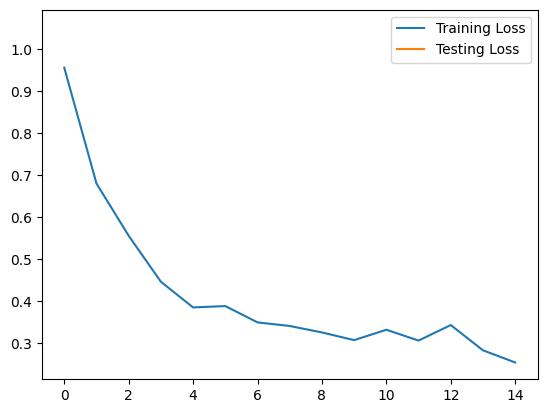

In [ ]:
solver.plot()

In [ ]:
# Plot the segmentation mask for one image by taking the most probable class predicted by the mode for each superpixel generated by SLIC
# Read the input image
img = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
# Read the ground truth image
seg_gt = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
seg_gt_rgb = cv2.cvtColor(seg_gt,cv2.COLOR_BGR2RGB)
# Convert the ground truth image into a single ID label
seg_pixel = convert_seg_to_pixel(seg_gt_rgb)
# Generate the superpixel segmentation using SLIC
superpixel_clusters = slic(img, n_segments=100, compactness=10)
# Obtain patches and labels from the superpixel clusters
patches, labels = extract_labels_from_patch(img, seg_gt_rgb, superpixel_clusters)


<ipython-input-3-f18edad7b664>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


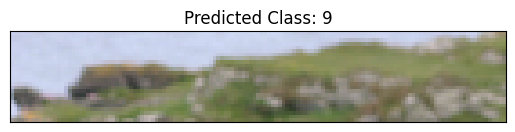

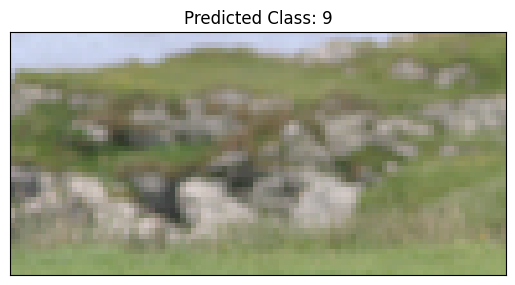

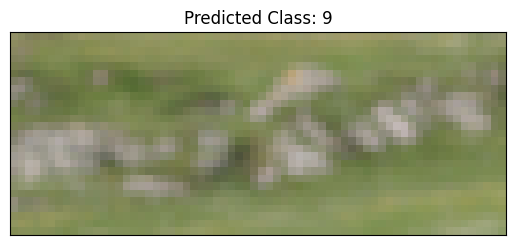

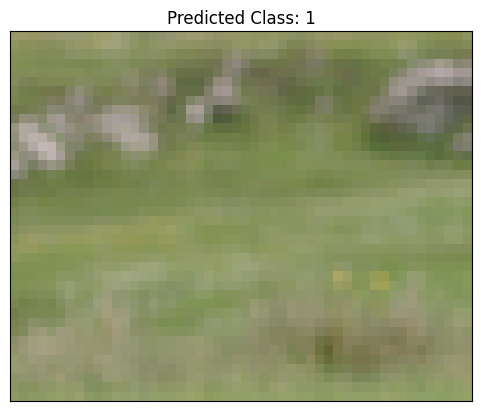

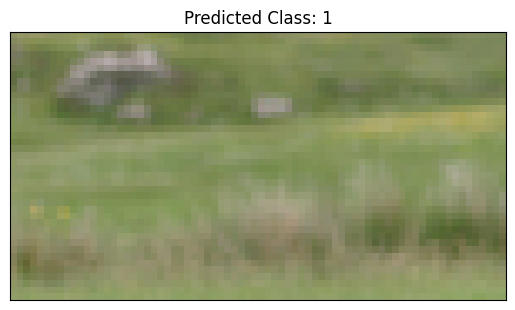

...

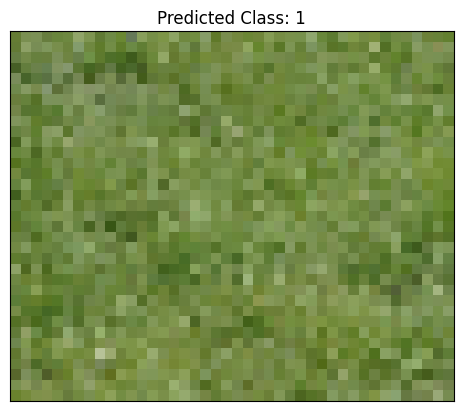

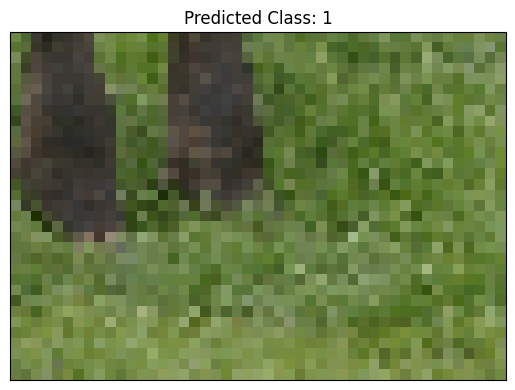

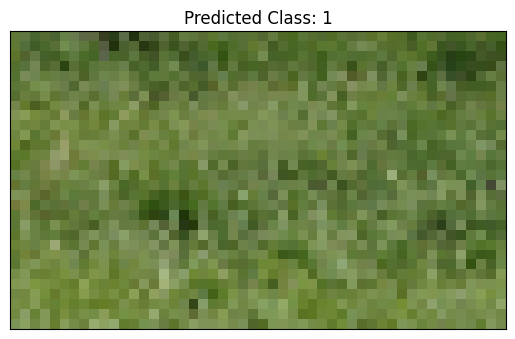

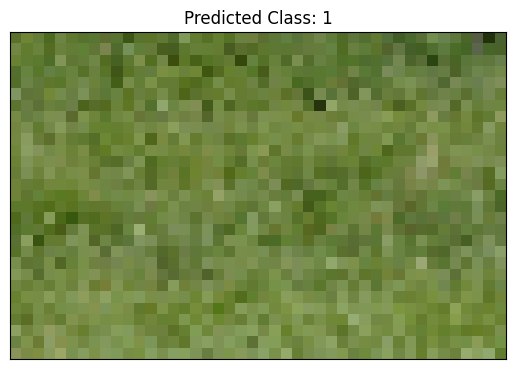

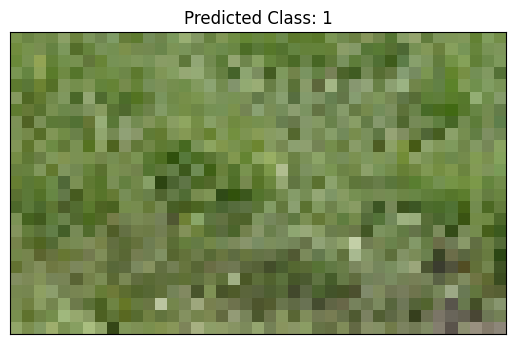

In [ ]:
# Iterate through all the patches and obtain the model prediction
patch_label_map = {}
predicted_superpixel_map = np.zeros_like(superpixel_clusters)
for i in range(len(patches)):
    # Convert the patch resize to 224x224 and convert it to a tensor
    patch = transforms.ToTensor()(transforms.Resize((224, 224))(Image.fromarray(patches[i])))
    # Bring the patch to gpu
    patch = patch.to(device)
    # Get the model prediction
    prediction = solver.classifier.forward(patch.unsqueeze(0))
    # Get the most probable class
    _, predicted = torch.max(prediction.data, 1)
    # Plot the patch with the predicted class
    plot_image(patches[i], "Predicted Class: " + str(predicted.item()))
    # Add the predicted class to the patch_label_map
    patch_label_map[i] = predicted.item()
    # Update the predicted_superpixel_map
    predicted_superpixel_map[superpixel_clusters == i] = predicted.item()

In [ ]:
# create a map label_2_rgb, where mapping the single ID label into a 3-d array segmentation.
label_2_rgb = {}
for i in SEG_LABELS_LIST_v1:
    label_2_rgb[i['id']] = i['rgb_values']

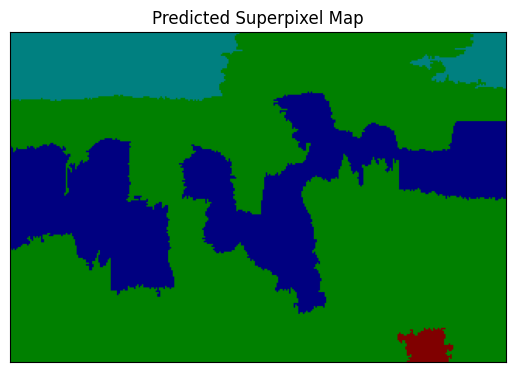

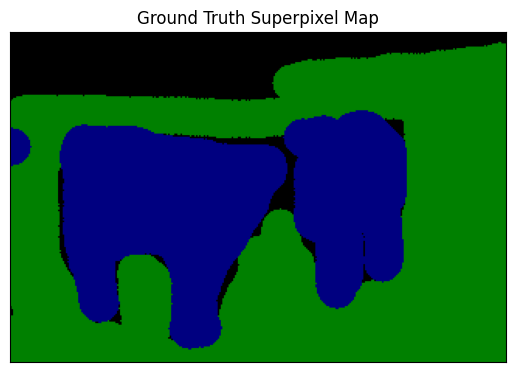

In [ ]:
# Create an RGB image from the predicted superpixel map
predicted_superpixel_map_rgb = np.zeros((predicted_superpixel_map.shape[0], predicted_superpixel_map.shape[1], 3))
# Iterate through the unique values in the predicted_superpixel_map
for i in np.unique(predicted_superpixel_map):
    # Create a mask for the superpixel
    mask = predicted_superpixel_map == i
    # Set the mask to the corresponding label
    predicted_superpixel_map_rgb[mask] = label_2_rgb[i]
# Convert the predicted_superpixel_map_rgb to BGR
predicted_superpixel_map_rgb = cv2.cvtColor(predicted_superpixel_map_rgb.astype(np.uint8), cv2.COLOR_RGB2BGR)
# Plot the predicted superpixel map
plot_image(predicted_superpixel_map_rgb, "Predicted Superpixel Map")
# Plot the ground truth superpixel map
plot_image(seg_gt, "Ground Truth Superpixel Map")

### Question 9: Bonus Question (20 points, OPTIONAL):

IMPORTANT: No matter which option you choose, you can earn a maximum of 20 points for this section.

We always want to increase the classifier accuracy and achieve a better performance by building a complicated deep learning model. There are a lot of tricks which are very popular and work in practice. Try to implement either of following two,

1. Could you effictively fuse different deep features from multiple layers in your network? You are welcome to use the pretrained network. Does your network achieve a better accuracy? There are a lot of exploration in the literature, including ION (Inside-Outside Net) [1], Hypercolumns [2], and PixelNet [3]. The following figure illustrates ION architecture combining features from different layers. Can you do similar thing for our Superpixel classifier?

2. Could you build a Multi-resolution network to explore the effectiveness of the multi-scale on the task of Superpixels segmentation? By multi-scale, we mean multiple resolutions of superpixels. See [4] for an example.

[1] Inside-Outside Net: Detecting Objects in Context with Skip Pooling and Recurrent Neural Networks

[2] Hypercolumns for Object Segmentation and Fine-grained Localization

[3] PixelNet: Representationofthe pixels, by the pixels, and for the pixels

[4] Feedforward semantic segmentation with zoom-out features

In [ ]:
# Bonus
